In [246]:
#cały zbiór
#brak dzielenia na 50 próbek z jednego wiersza - scalanie postów
#bez usuwania wierszy jeśli mają poniżej 50 postów
#podział następuje dopiero po preprocessingu

#uzupełnienie zbioru?

In [7]:
import tensorflow as tf
print(tf.config.list_physical_devices('GPU'))

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


### Import bibliotek

In [8]:
import random
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

import nltk
#from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.tokenize import TweetTokenizer
import re

from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences

### Zbiór danych

Pochodzi z platformy Kaggle: https://www.kaggle.com/datasets/datasnaek/mbti-type .

In [9]:
#każdy rząd składa się z typu osobowości i 50 ostatnich postów
df = pd.read_csv('mbti_1.csv', sep=',')
df.head()

,type,posts
0,INFJ,'http://www.youtube.com/watch?v=qsXHcwe3krw|||...
1,ENTP,'I'm finding the lack of me in these posts ver...
2,INTP,'Good one _____ https://www.youtube.com/wat...
3,INTJ,"'Dear INTP, I enjoyed our conversation the o..."
4,ENTJ,'You're fired.|||That's another silly misconce...


In [10]:
df.shape

(8675, 2)

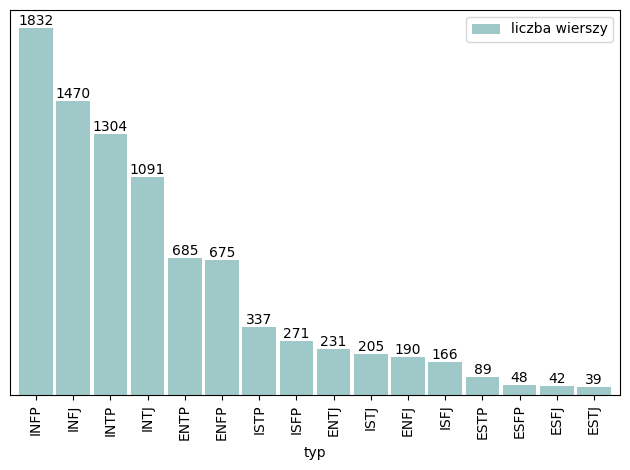

In [11]:
#podstawowy zbiór danych - dystrybucja postów między typami
#https://www.simplifiedsciencepublishing.com/resources/best-color-palettes-for-scientific-figures-and-data-visualizations

ax = df.groupby('type').count().sort_values(by='posts', ascending=False).plot.bar(width=0.9, color='#9fc8c8')
ax.bar_label(ax.containers[0])[1]
ax.legend(["liczba wierszy"])
ax.set_xlabel("typ")
ax.yaxis.set_visible(False)
ax.figure.tight_layout()
ax.figure.savefig('distribution.png')

In [12]:
#16 typów osobowości - nazwy klas
types = df.type.unique().tolist()
print(types)

#dodanie kolumny z klasami wyrażonymi liczbami (0 - 15)
df['class_no'] = df.apply(lambda x: types.index(x['type']), axis=1)

df

['INFJ', 'ENTP', 'INTP', 'INTJ', 'ENTJ', 'ENFJ', 'INFP', 'ENFP', 'ISFP', 'ISTP', 'ISFJ', 'ISTJ', 'ESTP', 'ESFP', 'ESTJ', 'ESFJ']


,type,posts,class_no
0,INFJ,'http://www.youtube.com/watch?v=qsXHcwe3krw|||...,0
1,ENTP,'I'm finding the lack of me in these posts ver...,1
2,INTP,'Good one _____ https://www.youtube.com/wat...,2
3,INTJ,"'Dear INTP, I enjoyed our conversation the o...",3
4,ENTJ,'You're fired.|||That's another silly misconce...,4
...,...,...,...
8670,ISFP,'https://www.youtube.com/watch?v=t8edHB_h908||...,8
8671,ENFP,'So...if this thread already exists someplace ...,7
8672,INTP,'So many questions when i do these things. I ...,2
8673,INFP,'I am very conflicted right now when it comes ...,6


In [13]:
#słownik odkodowujący
idx_to_type = {}
for i, t in enumerate(types): idx_to_type[i] = t

idx_to_type

{0: 'INFJ',
 1: 'ENTP',
 2: 'INTP',
 3: 'INTJ',
 4: 'ENTJ',
 5: 'ENFJ',
 6: 'INFP',
 7: 'ENFP',
 8: 'ISFP',
 9: 'ISTP',
 10: 'ISFJ',
 11: 'ISTJ',
 12: 'ESTP',
 13: 'ESFP',
 14: 'ESTJ',
 15: 'ESFJ'}

In [14]:
df['posts'][2]

"'Good one  _____   https://www.youtube.com/watch?v=fHiGbolFFGw|||Of course, to which I say I know; that's my blessing and my curse.|||Does being absolutely positive that you and your best friend could be an amazing couple count? If so, than yes.   Or it's more I could be madly in love in case I reconciled my feelings (which at...|||No, I didn't; thank you for a link!|||So-called Ti-Si loop (and it can stem from any current topic/obsession) can be deadly. It's like when you're stuck in your own thoughts, and your mind just wanders in circles. Feels truly terrible. ...|||Have you noticed how peculiar vegetation can be? All you have to do is look down at the grass: dozens of different plant species there.    And now imagine that hundreds of years later (when/if soil...|||The Smiths – Never Had No One Ever|||I often find myself spotting faces on marble tiles/wood.|||This 5 year-old sentence is an incredibly accurate and beautiful description.|||I haven't visited this website in the last 3

In [15]:
#zamiana separatora postów na zwykłą spację
df['posts_merged'] = df['posts'].str.replace(pat = '|||', repl = ' ')

In [16]:
df['posts_merged'][2]

"'Good one  _____   https://www.youtube.com/watch?v=fHiGbolFFGw Of course, to which I say I know; that's my blessing and my curse. Does being absolutely positive that you and your best friend could be an amazing couple count? If so, than yes.   Or it's more I could be madly in love in case I reconciled my feelings (which at... No, I didn't; thank you for a link! So-called Ti-Si loop (and it can stem from any current topic/obsession) can be deadly. It's like when you're stuck in your own thoughts, and your mind just wanders in circles. Feels truly terrible. ... Have you noticed how peculiar vegetation can be? All you have to do is look down at the grass: dozens of different plant species there.    And now imagine that hundreds of years later (when/if soil... The Smiths – Never Had No One Ever I often find myself spotting faces on marble tiles/wood. This 5 year-old sentence is an incredibly accurate and beautiful description. I haven't visited this website in the last 3 years. So whoever

In [17]:
df['posts'][22]

"'Now I'm interested. But too lazy to go research it, because it's time-consuming :(|||Welcome to the club, mate!   https://s-media-cache-ak0.pinimg.com/originals/a3/18/64/a31864d4b4f164aa86dcba911598da6c.gif|||That profile picture of yours is SOOOOOOOO INFP.  Welcome!|||Welcome back!|||Is it a communist party? Sorry, had to ask.      Alkhemia Welcome! That's an interesting nickname you've got there BTW. It sounds to be a female name, but clearly has something to do with...|||http://media.giphy.com/media/HU7a0iLaQCPQc/giphy.gif|||Anything that fucks with my mind is a no.  I mean, I can drink some red wine just for the taste but that's it.  Not sure if this thread is only replied to by (former) drug addicts or if the...|||It's not that much the difference between online and offline, but the difference between talking about serious and non-serious things.  I'm the same person IRL and online, but others' perception of...|||That sounds somewhat like me, apart from the gossip thing. And the

In [18]:
df['posts'][97]

"'https://www.youtube.com/watch?v=8IEQpfA528M  :ball:|||Kind of ironic that you talk about colours... seeing as for a very long time you have only been able to see the world in grey.   https://www.youtube.com/watch?v=1ENfTe2NFAc ...|||http://www.lovehorsepower.com/galleries/44269331/CheeseDS/album/slides/funny-pictures-8-lives-cat.jpg  :ball:|||Fictitious painted Mona Lisa smile versus hearing genuine and innocent laughter of a child. Thinking rationally... which one of the two do you think really adds anything to a society?  :ball:|||Are you trying to argue again? Remember to soften up and be mush.  :ball:|||I had a suspicion that you were a deconstructionist.The only thing you obliterated was the original (and very interesting) point made Tucken with a mediocre and superficial ramble.  I'm pretty...|||Well you said Tucken has a very valid point. So what exactly isn't important to you?  :ball:|||Well would it help you if I brought your attention to the title of the thread as a startin

### Rozpakowanie postów

Każdy z wierszy zawiera wewnątrz 50 postów. Nie rozdzielamy ich, są już złączone w jeden długi tekst.

In [19]:
#usunięcie rozdzielonej kolumny
df = df.drop(columns = ['posts'])

In [20]:
df.dtypes

type            object
class_no         int64
posts_merged    object
dtype: object

In [21]:
#zmiana typów zmiennych
df = df.astype({'type':'string', 'posts_merged':'string'})

In [22]:
df.head()

,type,class_no,posts_merged
0,INFJ,0,'http://www.youtube.com/watch?v=qsXHcwe3krw ht...
1,ENTP,1,'I'm finding the lack of me in these posts ver...
2,INTP,2,'Good one _____ https://www.youtube.com/wat...
3,INTJ,3,"'Dear INTP, I enjoyed our conversation the o..."
4,ENTJ,4,'You're fired. That's another silly misconcept...


### Czyszczenie tekstu i ekstrakcja cech

Tokenizacja

In [23]:
df.posts_merged[5]

"'18/37 @.@ Science  is not perfect. No scientist claims that it is, or that scientific  information will not be revised as we discover new things.  Rational  thinking has been very useful to our society.... INFP- Edgar Allen Poe was an INFP and he's in your siggy. People see the obvious Fi and are quick to put her as INFP. I agree that she has no Ne. I see her as an ISFP. Compare her to Haku (definite INFP). She is flat through most of Naruto.. but I don't... Lets get this party started  66314 I did not say it disproved God. I merely said that I found such methods disturbing. Although, it does bring up certain questions. God is in control of the universe, and the governments of the world,... Surprisingly, I could not find a thread about this on perc even with Google. So, here you go.  Watch Jesus Camp online - Watch Movies Online, Full Movies, Download  I was disturbed watching this... A metaphysical gun (Hell) held to someone's head can be just as effective as an actual gun.  Do you 

In [24]:
from nltk.tokenize import word_tokenize
df['post_words_trial'] = df.apply(lambda x: word_tokenize(x['posts_merged'].lower()), axis=1)

In [25]:
#zmiejszenie liter i rozdzielenie ciągów znaków na listy słów/cząstek
# df_test['post_words'] = df_test.apply(lambda x: word_tokenize(x['post'].lower()), axis=1)
# df_train['post_words'] = df_train.apply(lambda x: word_tokenize(x['post'].lower()), axis=1)

#zmiejszenie liter i rozdzielenie ciągów znaków na listy słów/cząstek - ten tokenizer nie rozdziela na "he" + "'s" i zachowuje całe emotki oraz hashtagi
tweet_tokenizer = TweetTokenizer()
df['post_words'] = df.apply(lambda x: tweet_tokenizer.tokenize(x['posts_merged'].lower()), axis=1)

In [26]:
t = "'Próbny tekst, aby 'sprawdzić rozłączność"
print(word_tokenize(t.lower()))
print(tweet_tokenizer.tokenize(t.lower()))

["'próbny", 'tekst', ',', 'aby', "'sprawdzić", 'rozłączność']
["'", 'próbny', 'tekst', ',', 'aby', "'", 'sprawdzić', 'rozłączność']


In [27]:
pd.set_option('max_colwidth', None)
print(df.loc[22, 'posts_merged'])
print(df.loc[22, 'post_words_trial'])
print(df.loc[22, 'post_words'])

'Now I'm interested. But too lazy to go research it, because it's time-consuming :( Welcome to the club, mate!   https://s-media-cache-ak0.pinimg.com/originals/a3/18/64/a31864d4b4f164aa86dcba911598da6c.gif That profile picture of yours is SOOOOOOOO INFP.  Welcome! Welcome back! Is it a communist party? Sorry, had to ask.      Alkhemia Welcome! That's an interesting nickname you've got there BTW. It sounds to be a female name, but clearly has something to do with... http://media.giphy.com/media/HU7a0iLaQCPQc/giphy.gif Anything that fucks with my mind is a no.  I mean, I can drink some red wine just for the taste but that's it.  Not sure if this thread is only replied to by (former) drug addicts or if the... It's not that much the difference between online and offline, but the difference between talking about serious and non-serious things.  I'm the same person IRL and online, but others' perception of... That sounds somewhat like me, apart from the gossip thing. And the interesting part

In [28]:
pd.set_option('max_colwidth', None)
print(df.loc[97, 'posts_merged'])
print(df.loc[97, 'post_words_trial'])
print(df.loc[97, 'post_words'])

'https://www.youtube.com/watch?v=8IEQpfA528M  :ball: Kind of ironic that you talk about colours... seeing as for a very long time you have only been able to see the world in grey.   https://www.youtube.com/watch?v=1ENfTe2NFAc ... http://www.lovehorsepower.com/galleries/44269331/CheeseDS/album/slides/funny-pictures-8-lives-cat.jpg  :ball: Fictitious painted Mona Lisa smile versus hearing genuine and innocent laughter of a child. Thinking rationally... which one of the two do you think really adds anything to a society?  :ball: Are you trying to argue again? Remember to soften up and be mush.  :ball: I had a suspicion that you were a deconstructionist.The only thing you obliterated was the original (and very interesting) point made Tucken with a mediocre and superficial ramble.  I'm pretty... Well you said Tucken has a very valid point. So what exactly isn't important to you?  :ball: Well would it help you if I brought your attention to the title of the thread as a starting point for you

In [29]:
pd.set_option('max_colwidth', None)
print(df.loc[0, 'posts_merged'])
print(df.loc[0, 'post_words_trial'])
print(df.loc[0, 'post_words'])

'http://www.youtube.com/watch?v=qsXHcwe3krw http://41.media.tumblr.com/tumblr_lfouy03PMA1qa1rooo1_500.jpg enfp and intj moments  https://www.youtube.com/watch?v=iz7lE1g4XM4  sportscenter not top ten plays  https://www.youtube.com/watch?v=uCdfze1etec  pranks What has been the most life-changing experience in your life? http://www.youtube.com/watch?v=vXZeYwwRDw8   http://www.youtube.com/watch?v=u8ejam5DP3E  On repeat for most of today. May the PerC Experience immerse you. The last thing my INFJ friend posted on his facebook before committing suicide the next day. Rest in peace~   http://vimeo.com/22842206 Hello ENFJ7. Sorry to hear of your distress. It's only natural for a relationship to not be perfection all the time in every moment of existence. Try to figure the hard times as times of growth, as... 84389  84390  http://wallpaperpassion.com/upload/23700/friendship-boy-and-girl-wallpaper.jpg  http://assets.dornob.com/wp-content/uploads/2010/04/round-home-design.jpg ... Welcome and stuf

In [30]:
pd.reset_option('max_colwidth')
df = df.drop(['post_words_trial'], axis=1)
df.columns

Index(['type', 'class_no', 'posts_merged', 'post_words'], dtype='object')

Słowa bez znaczenia

In [31]:
#usuwanie słów bez znaczenia ('stopwords')
nltk.download('stopwords')

#wszystkie są pisane małymi literami
#uwaga - usunięte będą zarówno słowa "have/has" jak i skrócone wersje "i've/he's" - jeśli typy osobowości znajdują rozróżnienie na tym polu to badanie będzie ograniczone
stopwords.words('english')[:15], stopwords.words('english')[-15:]

#co istotne - zbiór zawiera zarówno wersje słów "w całości" jak i "w częściach" (dowolność tokenizacji): ‘won’, ‘t’, “won’t”
#nie zawiera cząstek, które otrzymamy używając word_tokenize biblioteki NLTK - "'s"

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\marta\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


(['i',
  'me',
  'my',
  'myself',
  'we',
  'our',
  'ours',
  'ourselves',
  'you',
  "you're",
  "you've",
  "you'll",
  "you'd",
  'your',
  'yours'],
 ["mustn't",
  'needn',
  "needn't",
  'shan',
  "shan't",
  'shouldn',
  "shouldn't",
  'wasn',
  "wasn't",
  'weren',
  "weren't",
  'won',
  "won't",
  'wouldn',
  "wouldn't"])

In [32]:
#jednoliterowe słowa bez znaczenia
for word in stopwords.words('english'):
    if len(word) == 1:
        print(word)

i
a
s
t
d
m
o
y


In [33]:
stop_set = set(stopwords.words('english'))

#problem
"i'm" in stop_set, "i've" in stop_set, "i" in stop_set, "have" in stop_set, "am" in stop_set, "im" in stop_set, "m" in stop_set, "'m" in stop_set
#należy rozdzielić słowa z uwzględnieniem apostrofów

(False, False, True, True, True, False, True, False)

In [34]:
df.post_words

0       [', http://www.youtube.com/watch?v=qsxhcwe3krw...
1       [', i'm, finding, the, lack, of, me, in, these...
2       [', good, one, ___, https://www.youtube.com/wa...
3       [', dear, intp, ,, i, enjoyed, our, conversati...
4       [', you're, fired, ., that's, another, silly, ...
                              ...                        
8670    [', https://www.youtube.com/watch?v=t8edhb_h90...
8671    [', so, ..., if, this, thread, already, exists...
8672    [', so, many, questions, when, i, do, these, t...
8673    [', i, am, very, conflicted, right, now, when,...
8674    [', it, has, been, too, long, since, i, have, ...
Name: post_words, Length: 8675, dtype: object

In [35]:
df['post_split'] = df.apply(lambda x: [word.split("'") for word in x.post_words], axis=1)

In [36]:
df.post_split

0       [[, ], [http://www.youtube.com/watch?v=qsxhcwe...
1       [[, ], [i, m], [finding], [the], [lack], [of],...
2       [[, ], [good], [one], [___], [https://www.yout...
3       [[, ], [dear], [intp], [,], [i], [enjoyed], [o...
4       [[, ], [you, re], [fired], [.], [that, s], [an...
                              ...                        
8670    [[, ], [https://www.youtube.com/watch?v=t8edhb...
8671    [[, ], [so], [...], [if], [this], [thread], [a...
8672    [[, ], [so], [many], [questions], [when], [i],...
8673    [[, ], [i], [am], [very], [conflicted], [right...
8674    [[, ], [it], [has], [been], [too], [long], [si...
Name: post_split, Length: 8675, dtype: object

In [37]:
#spłaszczanie list

df['post_flatten'] = df.apply(lambda x: [word for sublist in x.post_split for word in sublist], axis=1)

In [38]:
df.post_flatten

0       [, , http://www.youtube.com/watch?v=qsxhcwe3kr...
1       [, , i, m, finding, the, lack, of, me, in, the...
2       [, , good, one, ___, https://www.youtube.com/w...
3       [, , dear, intp, ,, i, enjoyed, our, conversat...
4       [, , you, re, fired, ., that, s, another, sill...
                              ...                        
8670    [, , https://www.youtube.com/watch?v=t8edhb_h9...
8671    [, , so, ..., if, this, thread, already, exist...
8672    [, , so, many, questions, when, i, do, these, ...
8673    [, , i, am, very, conflicted, right, now, when...
8674    [, , it, has, been, too, long, since, i, have,...
Name: post_flatten, Length: 8675, dtype: object

In [39]:
#usuwanie słów bez znaczenia
df['post_no_stopwords'] = df.apply(lambda x: [word for word in x.post_flatten if word not in stop_set], axis=1)

In [40]:
df.columns

Index(['type', 'class_no', 'posts_merged', 'post_words', 'post_split',
       'post_flatten', 'post_no_stopwords'],
      dtype='object')

In [41]:
print(df.iloc[2, 2]) #oryginał
print(df.iloc[2, 3]) #zmniejszenie liter i tokenizacja
print(df.iloc[2, 5]) #rozdzielenie względem apostrofu
print(df.iloc[2, 6]) #słowa bez znaczenia usunięte

'Good one  _____   https://www.youtube.com/watch?v=fHiGbolFFGw Of course, to which I say I know; that's my blessing and my curse. Does being absolutely positive that you and your best friend could be an amazing couple count? If so, than yes.   Or it's more I could be madly in love in case I reconciled my feelings (which at... No, I didn't; thank you for a link! So-called Ti-Si loop (and it can stem from any current topic/obsession) can be deadly. It's like when you're stuck in your own thoughts, and your mind just wanders in circles. Feels truly terrible. ... Have you noticed how peculiar vegetation can be? All you have to do is look down at the grass: dozens of different plant species there.    And now imagine that hundreds of years later (when/if soil... The Smiths – Never Had No One Ever I often find myself spotting faces on marble tiles/wood. This 5 year-old sentence is an incredibly accurate and beautiful description. I haven't visited this website in the last 3 years. So whoever 

In [42]:
print(df.iloc[4, 2]) #oryginał
print(df.iloc[4, 3]) #zmniejszenie liter i tokenizacja
print(df.iloc[4, 5]) #rozdzielenie względem apostrofu
print(df.iloc[4, 6]) #słowa bez znaczenia usunięte

'You're fired. That's another silly misconception. That approaching is logically is going to be the key to unlocking whatever it is you think you are entitled to.   Nobody wants to be approached with BS... But guys... he REALLY wants to go on a super-duper-long-ass vacation. C'mon guys. His boss just doesn't listen or get it. He even approached him logically and everything. Never mind. Just go on permanent vacation. Two months? I wouldn't be crazy about the idea. If you are really his best employee, then that's what may be cooking him. Who wants their most reliable asset gone for that long?  ENTJ employer... Lol. Its not like our views were unsolicited. What a victim. Sometimes I just really like impoverished rap music.   https://www.youtube.com/watch?v=Xh0vA6_8mv8 I probably would have lost it too. His stonewalling was insignificant. He was being an idiot over semantics that didn't have any impact on anything. It's one thing to stone wall on critical shit, but... I would have just tak

Linki

In [43]:
#zamiana linków na słowo kluczowe
def replace_URL(str):
    return re.sub(r"http\S+", "[LINK]", str)

df['post_links'] = df.apply(lambda x: [replace_URL(word) for word in x.post_no_stopwords], axis=1)

In [44]:
#sprawdzenie linków
only_link = 0
for index, row in df.iterrows():
    if "[LINK]" in row["post_links"]:
        #print(row["post_no_stopwords"], row["post_links"])
        if row["post_links"] == ['[LINK]']: only_link += 1
print("Ramka zawiera", only_link, "postów zawierających jedynie jeden link (na", df.shape[0],"postów).")

Ramka zawiera 0 postów zawierających jedynie jeden link (na 8675 postów).


Emotikony

In [45]:
#szukanie emotikon (nie zawierających liczb!)

for index, row in df.iterrows():
    for r in row["post_links"]:
        if(re.search(r"\A[^\sa-zA-Z0-9_.]{2,}\Z", r)):
           if r != "...": print(r)

=/
:)
:)
:)
:)
:)
):
:)
:)
:)
:)
:)
:)
:)
=/
;)
=/
:)
:)
:)
;)
:)
:)
:)
:)
:)
:)
<---
:)
--->
:)
;)
:)
:)
:)
;)
:)
:)
):
::
::
::
::
:(
:)
:)
:)
:)
:)
:)
:)
:)
:)
:)
:)
:)
:)
:)
:)
:)
;)
:)
:)
;)
:)
:)
:)
:)
:)
:)
:)
:)
:)
:)
:(
:)
:)
:(
:)
:)
:(
;)
;)
;)
:)
:)
;)
:)
:)
:)
:)
:)
:)
:)
:)
:)
:)
:)
:(
:/
:/
:)
:)
:)
:(
:(
:)
:)
:)
:)
:)
:)
:)
:)
:)
:)
:)
:)
;)
:(
;)
->
):
:)
:)
:)
:)
;)
:)
:)
:)
;)
:)
;)
:)
:)
:)
:)
=/
:/
:)
:(
:(
;)
:)
:)
:)
:)
):
:)
:)
:)
::
::
;)
:)
:)
:)
:(
:)
:)
:)
):
::
::
::
:)
;)
:)
::
::
::
::
:/
::
(:
(:
(:
(:
(:
(:
(:
(:
);
(:
(:
(:
(:
:)
(:
:)
;)
:)
:)
:)
:)
:/
):
:)
:)
):
:)
:)
:)
:)
:)
:)
:)
:)
:)
:)
;)
:/
:)
:/
:/
:)
:)
:)
:)
:)
):
:)
<-
::
::
::
::
:)
:(
:)
:(
):
:)
:)
:)
:)
;)
;)
):
):
:)
):
:)
:)
:)
:)
:)
:)
:)
:)
:)
:/
:)
:(
:/
:)
:)
:)
:)
:)
:)
:)
:)
:/
):
:)
:)
[:
::
::
::
::
::
:]
<---
(:
:(
(:
:)
:)
:)
:)
:)
:)
:)
:)
:)
:)
:)
:)
:)
:)
):
=)
=)
=)
=)
=)
:)
:/
::
:)
:)
:)
:)
:)
:)
:)
;)
::
::
::
:)
::
::
::
::
::
::
:)
:)
:)
:)
:)
:)
:)
:)
:)
:)
:)
:

In [46]:
#zamiana powszechnych emoji na słowo kluczowe (emotki bez liczb + emotka serce)

def delete_foreign_emoji(str):
    return re.sub(r"사랑", "", str)

def replace_emojis(str):
    str = re.sub(r"\A[^\sa-zA-Z0-9_.]{2,}\Z", "[EMOJI]", str)
    str = re.sub(r"\A[:;][pd]\Z", "[EMOJI]", str)
    str = re.sub(r"<3", "[EMOJI]", str)
    str = re.sub(r"❤", "[EMOJI]", str)
    return str

df['post_emojis'] = df.apply(lambda x: [replace_emojis(delete_foreign_emoji(word)) for word in x.post_links], axis=1)

Interpunkcja

In [47]:
#flagowanie istotnych znaków interpunkcyjnych (kropek, wielokropka, wykrzykników, pytajników, bo mogą być znaczące dla analizy)
def replace_punctuation(str):
    str = re.sub(r"\A\.\.\.\Z", "[ELLIPSIS]", str)
    str = re.sub(r"\A\?\Z", "[QUESTION_MARK]", str)
    str = re.sub(r"\A!\Z", "[EXCLAMATION_MARK]", str)
    str = re.sub(r"\A\.\Z", "[PERIOD]", str)
    return str

df['post_punctuation_flags'] = df.apply(lambda x: [replace_punctuation(word) for word in x.post_emojis], axis=1)

In [48]:
df.columns

Index(['type', 'class_no', 'posts_merged', 'post_words', 'post_split',
       'post_flatten', 'post_no_stopwords', 'post_links', 'post_emojis',
       'post_punctuation_flags'],
      dtype='object')

In [49]:
print(df.iloc[10,8])
print(df.iloc[10,9])

['', '', 'one', 'time', 'parents', 'fighting', 'dad', 'affair', 'dad', 'pushed', 'mom', '.', 'fall', 'broke', 'finger', '.', 'pointed', 'gun', 'made', 'get', 'knees', 'beg', 'life', '.', '...', 'gonna', 'talk', 'piece', 'shit', 'dad', '.', 'alcoholic', 'kind', 'serious', 'mental', 'problem', 'comes', 'complying', 'irs', '.', '(', 'words', ',', 'laws', 'apply', '...', 'omg', '...', 'women', 'center', 'lived', ',', 'run', 'catholic', 'charity', ',', 'fat', 'bully', 'program', 'manager', 'took', 'upon', 'change', 'policy', 'tenants', 'forced', 'attend', 'christmas', 'party', '.', '...', 'work', ',', 'calling', '100', '%', 'committed', '24/7', 'vacation', 'days', 'ever', '.', 'kundalini', 'mystic', '.', 'oh', ',', 'get', 'paid', ',', 'either', '!', 'one', 'destined', 'things', '...', 'art', 'teacher', 'high', 'school', 'stack', 'art', 'school', 'catalogs', '.', 'saw', 'one', 'school', 'ended', 'going', ',', 'immediately', 'knew', 'one', '.', 'without', 'research', '.', 'like', '...', 'infj

In [50]:
#szukanie przypadkowych i nieznaczących zbiorów znaków
for index, row in df.iterrows():
    for r in row["post_punctuation_flags"]:
        if(re.search(r"\A[^a-zA-Z0-9]+\Z", r)):
            if r not in ["[LINK]", "[EMOJI]", "[ELLIPSIS]", "[QUESTION_MARK]", "[EXCLAMATION_MARK]", "[PERIOD]"]:
                print(r)

~
,
,
,
(
)
,
(
(
)
,
,
,
:
:
,
:
:
:
:
/
,
,
,
. ...
,
,
)
)
,
)
,
:
,
*
*
+
,
,
,
/
,
,
;
/
/
;
:
;
(
:
=
;
,
,
,
,
*
*
,
(
)
,
;
,
,
,
>
>
<
<
,
:
:
(
+
)
___
,
;
,
(
,
;
(
/
)
,
. ...
:
(
/
–
/
(
,
,
(
)
-
..
-
:
-
,
,
-
-
,
,
-
(
..
;
,
-
..
,
;
,
(
)
,
/
,
..
,
(
)
,
)
)
)
,
,
,
;
,
,
,
,
(
,
,
-
(
,
)
,
,
:
,
,
,
,
,
,
,
,
,
%
,
,
,
,
-
[
]
,
,
,
,
,
,
,
,
,
,
,
,
,
:
:
,
:
,
,
/
=
,
,
(
,
,
,
,
,
,
,
,
,
,
,
,
,
(
)
,
(
)
%
,
,
,
,
,
,
,
,
,
,
,
,
,
,
,
,
/
,
,
:
:
:
<
:
,
:
,
-
:
:
-
,
,
,
,
,
,
,
,
,
,
,
/
=
,
,
,
,
,
-
@
@
,
-
(
)
..
,
,
,
,
,
-
,
,
(
)
-
,
,
,
,
,
,
,
,
,
,
,
;
,
;
,
<
(
)
,
,
,
,
,
,
,
;
;
,
-
(
)
,
;
,
,
,
;
(
,
,
,
,
,
,
+
+
,
,
,
(
/
)
(
&
)
/
(
&
)
-
(
)
,
,
,
:
,
,
,
,
,
(
)
,
(
)
,
,
,
-
,
,
,
(
)
,
.  ...
,
,
(
,
(
)
,
,
:
,
-
-
-
-
(
)
-
-
,
,
,
(
)
,
,
,
:
-
,
,
:
:
*
*
,
,
,
？
,
-
-
,
,
,
,
,
,
:
,
:
:
,
,
,
,
-
,
:
:
,
,
,
:
:
,
,
,
(
)
:
:
,
-
,
,
,
,
-
,
,
,
,
-
-
-
:
-
(
<
,
,
,
>
)
<
,
:
:
:
,
/
,
,
,
:
,
(
,
,
,
)
:
(
)
:
:
,
,
,
:
:
,
:
,


In [51]:
#usuwanie przypadkowych i nieznaczących zbiorów znaków
def delete_punctuation(str):
    if(re.search(r"\A[^a-zA-Z0-9]+\Z", str)):
        if str not in ["[LINK]", "[EMOJI]", "[ELLIPSIS]", "[QUESTION_MARK]", "[EXCLAMATION_MARK]", "[PERIOD]"]:
            str = re.sub(r"\A[^a-zA-Z0-9_]+\Z", "", str)
    return str

df['post_punctuation_cleaned'] = df.apply(lambda x: [delete_punctuation(word) for word in x.post_punctuation_flags], axis=1)

In [52]:
print(df.iloc[1,9])
print(df.iloc[1,10])

['', '', 'finding', 'lack', 'posts', 'alarming', '[PERIOD]', 'sex', 'boring', 'position', 'often', '[PERIOD]', 'example', 'girlfriend', 'currently', 'environment', 'creatively', 'use', 'cowgirl', 'missionary', '[PERIOD]', 'enough', '[ELLIPSIS]', 'giving', 'new', 'meaning', '', '', 'game', '', '', 'theory', '[PERIOD]', 'hello', '*', 'entp', 'grin', '*', 'takes', '[PERIOD]', 'converse', 'flirting', 'acknowledge', 'presence', 'return', 'words', 'smooth', 'wordplay', 'cheeky', 'grins', '[PERIOD]', '+', 'lack', 'balance', 'hand', 'eye', 'coordination', '[PERIOD]', 'real', 'iq', 'test', 'score', '127', '[PERIOD]', 'internet', 'iq', 'tests', 'funny', '[PERIOD]', 'score', '140s', 'higher', '[PERIOD]', ',', 'like', 'former', 'responses', 'thread', 'mention', 'believe', 'iq', 'test', '[PERIOD]', 'banish', '[ELLIPSIS]', 'know', 'entp', 'vanish', 'site', 'year', 'half', ',', 'return', ',', 'find', 'people', 'still', 'commenting', 'posts', 'liking', 'ideas', '/', 'thoughts', '[PERIOD]', 'know', 'en

Liczby

In [53]:
#szukanie liczb
for index, row in df.iterrows():
    for r in row["post_punctuation_cleaned"]:
        if(re.search(r"\A[0-9]+\Z", r)):
            print(r)

7
84389
84390
1
2
3
49142
127
4
24
5
3
57
34
90
357002
3
349890
256818
246386
97
236994
06
358
368
358
385
9
2
351
3
3
1
6
66314
1
1
2
8
2012
90
06
718314
20
30
20
2
3
78
94
1
2
651762
3
1
2
2
201011
70
35
15
1
2
1
3
629346
90
90
2
10
1
6
100
1
5
5
30
10
2
51
4
2
3
21
15
18
21
20
11
1
5
1
22
6
2
3
6
8
5
1
230346
1933
24
26
37
2
226530
101
9
5
1
30
4
3
2005
35
90
1
478
468
451
458
3
1
2
50
50
13
2
1960
9
5
10
100
7
1
1
2
3
15
85
147410
1934
85
1
1
3
21
91
16
26
16
20
45016
40386
9
4
9
6
8
3
8
2
79
58551
62984
1
2
3
12
13
90
10
30
6
117
5
0
15
3
4
5
10
3
4
5
10
15
5
0
4
10
15
5
0
15
4
5
5
0
15
5
36
35
1
2
3
4
543570
2
25
56
38
6
0
25
50
19
203786
5
1
2
10
2
20
1
2
594
459
2
2
2
10
100
15
16
99
3
90
5110
5110
1
1
93943
1
2
3
6
2
5
9
0
4
12
1
2
3
1
16
2
10
5
14
30
199738
11
488698
1
132001
1
1
2
19
75160
3
73757
50
1
1
1
2
4
5
95
89
1
30
300
2
3
2
1
2
3
1
20
3
425906
593
953
9
5
40
6
50
5
95
9
1
4
55
3
517682
1
6
6
1984
1
3
24
4
6
7
10
4
9
9
8
9
8
0
8
2
28
2
50
73
2
99
100
3
16
13
45
16
3


In [54]:
#flagowanie czystych liczb (ich dokładne wartości nie mają znaczenia, a poszerzą słownik)
def replace_numbers(str):
    return re.sub(r"\A[0-9]+\Z", "[NUMBER]", str)

df['post_numbers'] = df.apply(lambda x: [replace_numbers(word) for word in x.post_punctuation_cleaned], axis=1)

In [55]:
print(df.iloc[6,10])
print(df.iloc[6,11])

['', '', '', 'draw', 'nails', '', 'haha', '', '[PERIOD]', 'done', 'professionals', 'nails', '[PERIOD]', 'yes', '', 'gel', '[PERIOD]', 'mean', 'posted', 'done', 'nails', '[QUESTION_MARK]', 'awesome', '[EXCLAMATION_MARK]', 'probably', 'electronic', 'screen', 'syndrome', '[PERIOD]', 'advent', 'technology', 'social', 'media', '', 'suffer', 'overstimulation', 'daily', 'basis', '[PERIOD]', 'guilty', 'well', '[PERIOD]', 'past', '', 'happy', '[ELLIPSIS]', 'love', 'nail', 'arts', '[EXCLAMATION_MARK]', 'mine', '', '718282 7182', '90', '718298 7183', '06', '718314', 'first', 'time', 'hearing', '', 'menstruation', 'church', '[PERIOD]', 'thanks', 'sharing', 'yeah', '', 'crazy', '[PERIOD]', 'thought', 'taoists', 'belief', '[PERIOD]', 'dear', 'bad', 'person', '', 'trying', 'get', 'arguments', 'copying', 'sentence', 'future', 'use', '[PERIOD]', '', 'tongue', '', '', 'speaking', 'bomb', 'shelter', '', 'christian', 'values', 'still', 'hold', '[QUESTION_MARK]', 'agree', 'people', 'still', 'good', 'absenc

Hashtagi

In [56]:
for index, row in df.iterrows():
    for r in row["post_numbers"]:
        if(re.search(r"#", r)):
            print(r)

#happy
#inlove
#loveuallguys
#virginaf
#ldjam
#151616
#251617
#whynotcapitalizeyourwordstomakeiteasiertoread
#hashbrownselfie
#9001
#wastehistime
#13
##identity
#you
#noshame
#ilovethissite
#thisthreadisawesome
#thisisahashtag
#hashtagsareannoying
#1529
#doublepost
#maj
#fifty-eleven
#11
#asdforchatboxmod
#asdforchatboxmod2017
#confused
#againsttheflow
#ohdear
#infjlife
#fridaynightlife
#irony
#publicschool
#aecbd1
#eeeeee
#frostyforadmin
#redisthenewpurple
#yolo
#1t
#swoon
#holmes
#stevejobstep
#pessimism
#infpproblems
#number
#esfpproblems
#1
#37
#4
#idontthinkso
#27
#pretentious
#maga
#sarcasmbutpossibletrue
#storyofmylife
#vaan
#realrandomthought
#10
#kerrygoldgrassfedbutter
#toolazytoreadall20pages
#takepityonme
#cancelcolbert
#cancelcolbert
#wokeaf
#personalitycafe
#16
#ickyface
#667
#451
#91
#insta-ugly
#rewritethisthread
#nofilter
#swag
#hashtag
#talentalert
#neverforget
#neverforget
#psilocybin
#mckenna
#13
#16
#91
#thehardlife
#es
#rare
#based
#000000
#15
#icouldn
#holiday
#3

In [57]:
def replace_hashtags(str):
    return re.sub(r"#", "", str)

df['post_no_hashtags'] = df.apply(lambda x: [replace_hashtags(word) for word in x.post_numbers], axis=1)

Usuwanie pustych elementów

In [58]:
df['post_cleaned'] = df.apply(lambda x: list(filter(None, x.post_no_hashtags)), axis=1)

In [59]:
print(df.iloc[2, 12])
print(df.iloc[2, 13])

['', '', 'good', 'one', '___', '[LINK]', 'course', '', 'say', 'know', '', 'blessing', 'curse', '[PERIOD]', 'absolutely', 'positive', 'best', 'friend', 'could', 'amazing', 'couple', 'count', '[QUESTION_MARK]', '', 'yes', '[PERIOD]', 'could', 'madly', 'love', 'case', 'reconciled', 'feelings', '', '[ELLIPSIS]', '', '', 'thank', 'link', '[EXCLAMATION_MARK]', 'so-called', 'ti-si', 'loop', '', 'stem', 'current', 'topic', '', 'obsession', '', 'deadly', '[PERIOD]', 'like', 'stuck', 'thoughts', '', 'mind', 'wanders', 'circles', '[PERIOD]', 'feels', 'truly', 'terrible', '', 'noticed', 'peculiar', 'vegetation', '[QUESTION_MARK]', 'look', 'grass', '', 'dozens', 'different', 'plant', 'species', '[PERIOD]', 'imagine', 'hundreds', 'years', 'later', '', '', 'soil', '[ELLIPSIS]', 'smiths', '', 'never', 'one', 'ever', 'often', 'find', 'spotting', 'faces', 'marble', 'tiles', '', 'wood', '[PERIOD]', '[NUMBER]', 'year-old', 'sentence', 'incredibly', 'accurate', 'beautiful', 'description', '[PERIOD]', 'visi

In [60]:
df.shape

(8675, 14)

In [61]:
df.columns

Index(['type', 'class_no', 'posts_merged', 'post_words', 'post_split',
       'post_flatten', 'post_no_stopwords', 'post_links', 'post_emojis',
       'post_punctuation_flags', 'post_punctuation_cleaned', 'post_numbers',
       'post_no_hashtags', 'post_cleaned'],
      dtype='object')

In [62]:
print(df.loc[0, 'post_no_stopwords'])
print(df.loc[0, 'post_cleaned'])

['', '', 'http://www.youtube.com/watch?v=qsxhcwe3krw', 'http://41.media.tumblr.com/tumblr_lfouy03pma1qa1rooo1_500.jpg', 'enfp', 'intj', 'moments', 'https://www.youtube.com/watch?v=iz7le1g4xm4', 'sportscenter', 'top', 'ten', 'plays', 'https://www.youtube.com/watch?v=ucdfze1etec', 'pranks', 'life-changing', 'experience', 'life', '?', 'http://www.youtube.com/watch?v=vxzeywwrdw8', 'http://www.youtube.com/watch?v=u8ejam5dp3e', 'repeat', 'today', '.', 'may', 'perc', 'experience', 'immerse', '.', 'last', 'thing', 'infj', 'friend', 'posted', 'facebook', 'committing', 'suicide', 'next', 'day', '.', 'rest', 'peace', '~', 'http://vimeo.com/22842206', 'hello', 'enfj', '7', '.', 'sorry', 'hear', 'distress', '.', 'natural', 'relationship', 'perfection', 'time', 'every', 'moment', 'existence', '.', 'try', 'figure', 'hard', 'times', 'times', 'growth', ',', '...', '84389', '84390', 'http://wallpaperpassion.com/upload/23700/friendship-boy-and-girl-wallpaper.jpg', 'http://assets.dornob.com/wp-content/upl

In [63]:
print(df.loc[6, 'post_no_stopwords'])
print(df.loc[6, 'post_cleaned'])

['', '', ',', 'draw', 'nails', '(', 'haha', ')', '.', 'done', 'professionals', 'nails', '.', 'yes', ',', 'gel', '.', 'mean', 'posted', 'done', 'nails', '?', 'awesome', '!', 'probably', 'electronic', 'screen', 'syndrome', '.', 'advent', 'technology', 'social', 'media', ',', 'suffer', 'overstimulation', 'daily', 'basis', '.', 'guilty', 'well', '.', 'past', ',', 'happy', '...', 'love', 'nail', 'arts', '!', 'mine', ':', '718282 7182', '90', '718298 7183', '06', '718314', 'first', 'time', 'hearing', '-', 'menstruation', 'church', '.', 'thanks', 'sharing', 'yeah', ',', 'crazy', '.', 'thought', 'taoists', 'belief', '.', 'dear', 'bad', 'person', ',', 'trying', 'get', 'arguments', 'copying', 'sentence', 'future', 'use', '.', ':', 'tongue', ':', '*', 'speaking', 'bomb', 'shelter', '*', 'christian', 'values', 'still', 'hold', '?', 'agree', 'people', 'still', 'good', 'absence', 'religion', 'people', 'also', 'bad', 'name', 'religion', '...', 'never', 'really', 'thought', 'childhood', 'experiences',

In [64]:
print(df.loc[67, 'post_no_stopwords'])
print(df.loc[67, 'post_cleaned'])

['', '', 'always', 'thought', 'tony', 'stark', 'entj', '...', '(', 'sort', 'matters', 'type', 'wondering', 'type', 'one', 'teachers', 'reference', 'point', 'much', 'like', '...', 'arya', 'debate', '(', 'may', 'put', 'useless', 'input', ')', '...', 'really', 'know', ',', 'honestly', '.', 'rejection', 'proper', 'right', 'society', 'seem', 'almost', 'like', 'fi', '...', 'way', '...', 'challenge', 'margaery', 'esfj', ',', 'rather', 'enfj', '?', 'seen', 'show', 'parts', ',', 'painted', 'picture', 'enfj', '...', 'least', 'agree', 'fe', ',', '...', 'really', 'agree', 'view', 'pinkie', 'fe', 'anything', '.', 'struck', 'realization', 'last', 'episode', ',', 'true', 'place', 'helping', 'people', 'making', 'happy', '.', '...', 'sure', 'wanda', 'type', ',', 'though', 'certainly', 'love', 'know', ';', 'one', 'absolute', 'favorite', 'characters', '.', 'always', 'struck', 'infj', '-', 'determined', '(', 'ni', ')', 'selfless', '(', 'fe', ')', '.', 'argue', '...', 'argue', 'rapunzel', 'enfp', '.', 'see

In [65]:
print(df.loc[40, 'post_no_stopwords'])
print(df.loc[40, 'post_cleaned'])

['', '', 'got', '593', '.', 'read', 'enneagram', '953', ',', 'though', '.', 'read', 'somewhere', 'lot', '9', '', '', 'mistype', '5', '', '', '.', 'gtfo', 'feeler', '!', 'lot', 'stuff', 'read', 'intp', 'descriptions', 'applies', 'istps', 'well', '.', 'like', 'mentioned', 'share', 'dominant', 'function', '.', 'honestly', ',', 'think', 'even', 'things', 'descriptions', '...', 'worry', '.', 'trying', 'make', 'sense', 'world', 'hard', 'ask', 'kind', 'question', 'without', 'offensive', '.', 'luckily', ',', 'istps', 'usually', 'get', 'offended', 'easily', '.', '...', 'mother-in-law', 'estj', '.', 'epitome', 'upstanding', 'citizen', '.', 'volunteers', 'church', '.', 'eager', 'kind', 'manual', 'labor', 'help', 'someone', '.', 'teacher', 'one', '...', 'rather', 'buy', 'cheap', 'lawn', 'mower', 'walk', 'behind', '40', 'minutes', 'week', 'drive', 'rental', 'shop', 'load', 'nice', 'mower', 'every', 'time', 'wanted', 'mow', 'yard', '.', 'pisses', 'enough', '...', 'think', 'great', 'ones', '.', 'may'

In [66]:
print(df.loc[81, 'post_no_stopwords'])
print(df.loc[81, 'post_cleaned'])

['', '', 'thanks', 'jaydubs', 'miss', 'bingley', 'littledreamer', 'advices', 'important', '!', ':d', '.', 'deal', 'familiar', 'wants', 'force', 'go', 'uni', '?', 'stand', 'grandma', 'cold', 'looks', '...', 'thanks', ':)', 'nice', 'nickname', ';)', 'thanks', '.', 'sounds', 'good', 'idea', ',', 'search', 'things', '.', 'degree', '?', 'asking', 'curious', 'life', 'uni', '.', '2019', 'finish', 'secondary', 'school', '.', 'still', 'time', 'like', 'plan', 'things', '(', 'unplanned', 'things', 'scare', 'death', ')', '.', 'everyone', 'says', 'go', 'uni', '.', 'student', '19', 'points', '20', ',', '...', 'thank', 'daiz', 'deal', 'annoying', 'classmates', 'always', 'pointing', 'errors', '?', 'tend', 'ignore', ',', 'find', 'repeating', 'words', 'say', '...', 'yes', 'works', 'time', ',', 'night', 'bed', 'nothing', 'like', 'hit', 'truck', ':/', 'one', 'forgive', 'oneself', '?', 'tried', 'still', 'move', '.', 'maybe', '...', 'hello', '!', '!', '!', 'also', 'love', 'learning', 'languages', 'drawing',

### Analiza cech

Zliczanie flag

In [67]:
flags = ["[LINK]", "[EMOJI]", "[ELLIPSIS]", "[QUESTION_MARK]", "[EXCLAMATION_MARK]", "[PERIOD]", "[NUMBER]"]

df_flags = df.copy(deep=True)

#dodawanie kolumn do zliczania flag
for flag in flags:
    df_flags[flag] = 0

df_flags.columns

Index(['type', 'class_no', 'posts_merged', 'post_words', 'post_split',
       'post_flatten', 'post_no_stopwords', 'post_links', 'post_emojis',
       'post_punctuation_flags', 'post_punctuation_cleaned', 'post_numbers',
       'post_no_hashtags', 'post_cleaned', '[LINK]', '[EMOJI]', '[ELLIPSIS]',
       '[QUESTION_MARK]', '[EXCLAMATION_MARK]', '[PERIOD]', '[NUMBER]'],
      dtype='object')

In [68]:
def add_metrics(list_of_words):
    metrics = []
    for flag in ["[LINK]", "[EMOJI]", "[ELLIPSIS]", "[QUESTION_MARK]", "[EXCLAMATION_MARK]", "[PERIOD]", "[NUMBER]"]:
        metrics.append(list_of_words.count(flag))
    return metrics

for row in df_flags.itertuples():
    df_flags.loc[row.Index, flags] = add_metrics(row.post_cleaned)

In [69]:
df_flags.loc[:, '[LINK]':].sum()

[LINK]                 28439
[EMOJI]                32537
[ELLIPSIS]            276797
[QUESTION_MARK]        74969
[EXCLAMATION_MARK]     69004
[PERIOD]              558526
[NUMBER]               72889
dtype: int64

In [70]:
df_flags.columns

Index(['type', 'class_no', 'posts_merged', 'post_words', 'post_split',
       'post_flatten', 'post_no_stopwords', 'post_links', 'post_emojis',
       'post_punctuation_flags', 'post_punctuation_cleaned', 'post_numbers',
       'post_no_hashtags', 'post_cleaned', '[LINK]', '[EMOJI]', '[ELLIPSIS]',
       '[QUESTION_MARK]', '[EXCLAMATION_MARK]', '[PERIOD]', '[NUMBER]'],
      dtype='object')

In [71]:
df_flags.loc[:, ('type', '[LINK]', '[EMOJI]', '[ELLIPSIS]', '[QUESTION_MARK]', '[EXCLAMATION_MARK]', '[PERIOD]', '[NUMBER]')].groupby("type").sum()

,[LINK],[EMOJI],[ELLIPSIS],[QUESTION_MARK],[EXCLAMATION_MARK],[PERIOD],[NUMBER]
type,,,,,,,
ENFJ,500,1173,6845,1721,2448,12052,1374
ENFP,1685,4629,23265,6484,10428,40747,5185
ENTJ,607,649,7141,2452,1706,15940,1967
ENTP,1632,2257,20789,6713,4653,43379,5994
ESFJ,55,212,1311,340,475,2684,396
ESFP,133,221,1237,502,478,2570,424
ESTJ,102,122,1187,354,298,2547,286
ESTP,287,272,2472,929,667,5616,722
INFJ,4811,6030,51008,12198,12789,95198,12074


Drzewo decyzyjne (eksperyment, czy zbiór jest opisywalny taką garstką cech)

In [67]:
x = df_flags.loc[:, ('[LINK]', '[EMOJI]', '[ELLIPSIS]', '[QUESTION_MARK]', '[EXCLAMATION_MARK]', '[PERIOD]', '[NUMBER]')]
y = df_flags.type

In [68]:
x, y

(      [LINK]  [EMOJI]  [ELLIPSIS]  [QUESTION_MARK]  [EXCLAMATION_MARK]  \
 0         24        1          14                2                   3   
 1          9       18          19                4                   0   
 2          5       10          12                9                   4   
 3          2        1          26                9                   3   
 4          6        3          21                8                   1   
 ...      ...      ...         ...              ...                 ...   
 8670       7        1           7                5                   6   
 8671       2       22          39               10                  30   
 8672       2        1          18                7                   1   
 8673       0        1          46                9                   3   
 8674       3        9          22                3                   5   
 
       [PERIOD]  [NUMBER]  
 0           35         7  
 1           99         3  
 2           3

In [69]:
#walidacja krzyżowa
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import cross_val_score

dec_tree = DecisionTreeClassifier(max_depth = 5)
cross_val_score(dec_tree, x, y, cv=10).mean()

0.22835788964542175

### Podział danych

In [72]:
from copy import deepcopy

#wycinki ramek danych (kopie głębokie) - jedynie wyczyszczone dane oraz numeryczne oznaczenia klas

print(df.columns)

df_cols = df[["type", "class_no", "post_cleaned"]].copy(deep=True)

Index(['type', 'class_no', 'posts_merged', 'post_words', 'post_split',
       'post_flatten', 'post_no_stopwords', 'post_links', 'post_emojis',
       'post_punctuation_flags', 'post_punctuation_cleaned', 'post_numbers',
       'post_no_hashtags', 'post_cleaned'],
      dtype='object')


In [73]:
df_cols.columns

Index(['type', 'class_no', 'post_cleaned'], dtype='object')

Ważne, aby posty jednej osoby nie znalazły się zarówno w zbiorze testowym jak i treningowym. W zbiorze testowym znajdzie się 20% wierszy każdego typu.

In [74]:
from sklearn.model_selection import train_test_split

# Split 80/20
df_train, df_test = train_test_split(df_cols, test_size=0.2, random_state=0, shuffle=True, stratify=df_cols.type)

In [75]:
tab = df_cols.loc[:, ['type', 'post_cleaned']].groupby('type').count()
tab2 = df_train.loc[:, ['type', 'post_cleaned']].groupby("type").count()
tab3 = df_test.loc[:, ['type', 'post_cleaned']].groupby("type").count()

tab.join(tab2, rsuffix="_train").join(tab3, rsuffix="_test")  #split review

,post_cleaned,post_cleaned_train,post_cleaned_test
type,,,
ENFJ,190,152,38
ENFP,675,540,135
ENTJ,231,185,46
ENTP,685,548,137
ESFJ,42,33,9
ESFP,48,38,10
ESTJ,39,31,8
ESTP,89,71,18
INFJ,1470,1176,294


### Modelowanie - BoW + TF-IDF, n-gram = (1, 1)

(array([1176.,  548., 1043.,  873.,  185.,  152., 1466.,  540.,  217.,
         270.,  133.,  164.,   71.,   38.,   31.,   33.]),
 array([ 0.,  1.,  2.,  3.,  4.,  5.,  6.,  7.,  8.,  9., 10., 11., 12.,
        13., 14., 15., 16.]),
 <BarContainer object of 16 artists>)

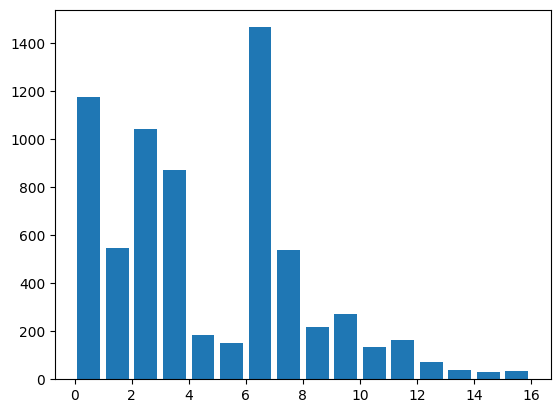

In [74]:
plt.hist(df_train.class_no, bins = list(range(0, 17)), rwidth = 0.8)

In [75]:
data_test_bow = df_test
data_train_bow = df_train

In [76]:
data_test_bow

,type,class_no,post_cleaned
3669,INTP,2,"[[NUMBER], tight, inbreeding, used, identify, ..."
2523,ENTP,1,"[absolutely, feel, home, stage, [PERIOD], prof..."
8117,INTP,2,"[indeed, [EXCLAMATION_MARK], critical-mass, am..."
180,ENTP,1,"[things, intelligent, persc, chatters, talk, [..."
7092,ISTJ,11,"[getting, along, entp, mostly, due, entp, show..."
...,...,...,...
1383,INTP,2,"[[NUMBER], average, female, scientist, also, c..."
2374,INFP,6,"[separate, rest, world, think, know, [PERIOD],..."
4422,ENFP,7,"[sure, [ELLIPSIS], throw, [NUMBER], cents, [PE..."
8335,INFP,6,"[[LINK], actually, listening, head, [ELLIPSIS]..."


In [77]:
#niepotrzebne po użyciu shuffle w train_test_split
# #przemieszanie bez seeda, ale w obrębie zbioru treningowego osobno, testowego osobno
# data_test_bow = data_test_bow.sample(frac = 1)
# data_train_bow = data_train_bow.sample(frac = 1)

In [78]:
data_test_bow['post_joined'] = data_test_bow.apply(lambda x: " ".join(x.post_cleaned), axis=1)
data_train_bow['post_joined'] = data_train_bow.apply(lambda x: " ".join(x.post_cleaned), axis=1)

In [79]:
data_train_bow.head()

,type,class_no,post_cleaned,post_joined
2710,ISTP,9,"[care, others, tattoos, would, never, get, tat...",care others tattoos would never get tattoo [PE...
5029,INFJ,0,"[momento, mori, [PERIOD], often, make, mistake...",momento mori [PERIOD] often make mistake watch...
3413,INFP,6,"[thoughts, erik, better, known, phantom, opera...",thoughts erik better known phantom opera infp ...
2166,INTJ,3,"[said, zero, flexibility, little, time, dating...",said zero flexibility little time dating [PERI...
8288,ENTP,1,"[glad, liked, [PERIOD], also, heard, quote, [P...",glad liked [PERIOD] also heard quote [PERIOD] ...


In [80]:
#Bag of Words

from sklearn.feature_extraction.text import CountVectorizer

vectorizer = CountVectorizer(max_features=5000)  #jeśli max_features niezdefiniowane - cały słownik
X_bow = vectorizer.fit_transform(data_train_bow.post_joined)   #fit & transform
X_bow.shape  #ponad 6 000 postów, około 5 000 słów

(6940, 5000)

In [81]:
vectorizer.vocabulary_   #uwaga, flaga [PERIOD] zamieniła się w procesie BoW na słowo period

{'care': 673,
 'others': 3170,
 'tattoos': 4420,
 'would': 4951,
 'never': 3015,
 'get': 1907,
 'tattoo': 4419,
 'period': 3275,
 'want': 4823,
 'odd': 3103,
 'looking': 2695,
 'older': 3125,
 'mention': 2840,
 'health': 2074,
 'risks': 3764,
 'involved': 2411,
 'also': 192,
 'ellipsis': 1425,
 'right': 3755,
 'handed': 2033,
 'though': 4512,
 'activities': 94,
 'involving': 2413,
 'number': 3069,
 'hands': 2037,
 'using': 4741,
 'left': 2607,
 'hand': 2032,
 'digging': 1247,
 'stick': 4239,
 'etc': 1530,
 'yes': 4980,
 'people': 3254,
 'said': 3813,
 'innate': 2315,
 'differences': 1240,
 'personality': 3282,
 'behavior': 466,
 'males': 2749,
 'females': 1707,
 'product': 3482,
 'biological': 502,
 'factors': 1641,
 'even': 1536,
 'areas': 287,
 'yeah': 4973,
 'pretty': 3452,
 'much': 2948,
 'agree': 151,
 'guys': 2018,
 'something': 4118,
 'unfair': 4696,
 'really': 3623,
 'counts': 1022,
 'otherwise': 3171,
 'real': 3614,
 'need': 2995,
 'think': 4503,
 'worry': 4944,
 'global': 193

In [82]:
#TF-IDF

from sklearn.feature_extraction.text import TfidfTransformer

tfidf_transformer = TfidfTransformer()
X_tfidf = tfidf_transformer.fit_transform(X_bow)
X_tfidf.shape  #ponad 6 000 postów, około 5 000 słów

(6940, 5000)

In [83]:
# import tensorflow.keras.utils as ku
Y = data_train_bow.class_no

In [84]:
X_bow_test = vectorizer.transform(data_test_bow.post_joined)   #transform
X_bow_test.shape  #niecałe 2 000 postów, 5 000 słów

(1735, 5000)

In [85]:
X_tfidf_test = tfidf_transformer.transform(X_bow_test)         #transform
X_tfidf_test.shape  #niecałe 2 000 postów, 5 000 słów

(1735, 5000)

In [86]:
Y_test = data_test_bow.class_no

Regresja logistyczna

https://machinelearningmastery.com/multinomial-logistic-regression-with-python/

https://gombru.github.io/2018/05/23/cross_entropy_loss/

ovr/multinomial?:
https://www.mygreatlearning.com/blog/multinomial-logistic-regression/

In [165]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, f1_score

In [94]:
#parametr C
acc_s = []
for c in [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1]:
    ml=LogisticRegression(C=c, n_jobs=-1, multi_class='multinomial')
    ml.fit(X_tfidf, Y)
    p = ml.predict(X_tfidf_test)
    acc_s.append(accuracy_score(Y_test, p))

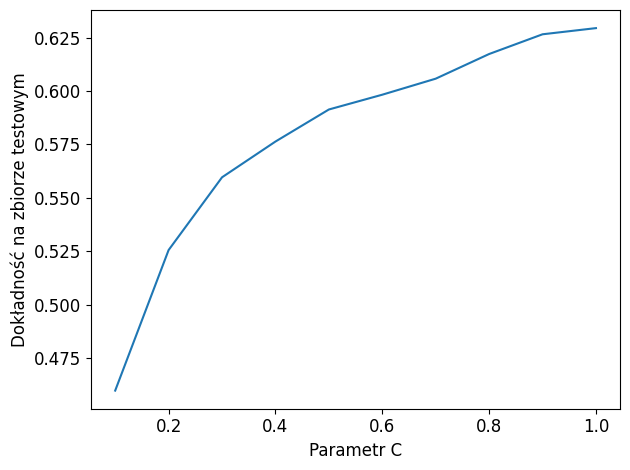

In [138]:
plt.plot([0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1], acc_s)
plt.xlabel('Parametr C', fontsize=12)
plt.ylabel('Dokładność na zbiorze testowym', fontsize=12)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.tight_layout()
plt.savefig('logistic_regression_c.png')

In [166]:
model_log=LogisticRegression(C=1, n_jobs=-1, multi_class='multinomial') #n_jobs=-1 means using all processors
model_log.fit(X_tfidf, Y)

LogisticRegression(C=1, multi_class='multinomial', n_jobs=-1)

In [167]:
# import sklearn
# sklearn.set_config(enable_metadata_routing=True)

model_log.solver, model_log.multi_class, model_log.penalty #uses the cross-entropy loss if the ‘multi_class’ option is set to ‘multinomial’.

('lbfgs', 'multinomial', 'l2')

In [171]:
# https://www.baeldung.com/cs/multi-class-f1-score

preds = model_log.predict(X_tfidf_test)

print("Dokładność: ", accuracy_score(Y_test, preds))
print("\nWskaźnik F1 dla poszczególnych klas: \n", f1_score(Y_test, preds, average=None))  #uwaga, najmniej liczne klasy mają 0
print("\nWskaźnik F1 po uśrednieniu: ", f1_score(Y_test, preds, average='macro'))

Dokładność:  0.6293948126801153

Wskaźnik F1 dla poszczególnych klas: 
 [0.68438538 0.61016949 0.67961165 0.6803653  0.22641509 0.14285714
 0.70149254 0.61157025 0.26470588 0.4        0.41860465 0.24
 0.         0.         0.         0.        ]

Wskaźnik F1 po uśrednieniu:  0.3537610860521331


In [172]:
f1_score(Y_test, preds, average=None).mean()  #sprawdzenie

0.3537610860521331

In [169]:
#zbiór treningowy
preds = model_log.predict(X_tfidf)
print("Dokładność: ", accuracy_score(Y, preds))
print("\nWskaźnik F1 dla poszczególnych klas: \n", f1_score(Y, preds, average=None))
print("\nWskaźnik F1 po uśrednieniu: ", f1_score(Y, preds, average='macro'))

Dokładność:  0.7260806916426513

Wskaźnik F1 dla poszczególnych klas: 
 [0.77643261 0.71976401 0.78709677 0.77331887 0.46090535 0.26815642
 0.77467199 0.70210632 0.41403509 0.69525959 0.34939759 0.41860465
 0.2        0.         0.         0.        ]

Wskaźnik F1 po uśrednieniu:  0.45873432950495574


Liniowy klasyfikator SVM

In [109]:
from sklearn.svm import LinearSVC
from sklearn.metrics import accuracy_score, f1_score

In [146]:
#parametr C
acc_s = []
for c in [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1]:
    msvc=LinearSVC(C=c, dual='auto', multi_class='ovr')
    msvc.fit(X_tfidf, Y)
    p = msvc.predict(X_tfidf_test)
    acc_s.append(accuracy_score(Y_test, p))

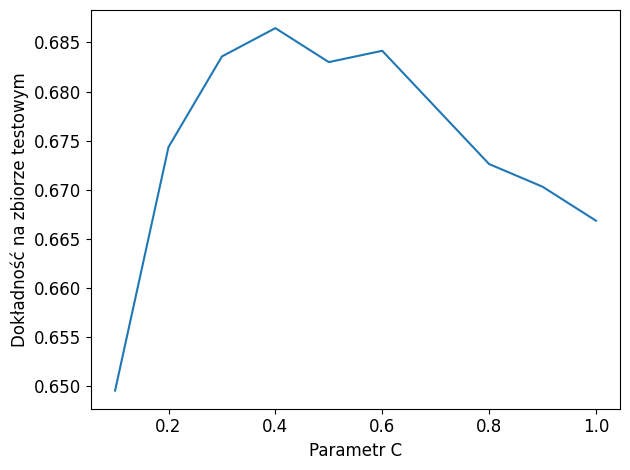

In [147]:
plt.plot([0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1], acc_s)
plt.xlabel('Parametr C', fontsize=12)
plt.ylabel('Dokładność na zbiorze testowym', fontsize=12)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.tight_layout()
plt.savefig('linear_SVM_c.png')

In [105]:
model_linear_svc=LinearSVC(C=0.4, dual='auto', multi_class='ovr')
model_linear_svc.fit(X_tfidf, Y)

LinearSVC(C=0.4, dual='auto')

In [106]:
model_linear_svc.loss, model_linear_svc.penalty

('squared_hinge', 'l2')

In [120]:
preds = model_linear_svc.predict(X_tfidf_test)

print("Dokładność: ", accuracy_score(Y_test, preds))
print("\nWskaźnik F1 dla poszczególnych klas: \n", f1_score(Y_test, preds, average=None))  #uwaga, tylko jedna klasa ma 0
print("\nWskaźnik F1 po uśrednieniu: ", f1_score(Y_test, preds, average='macro'))

Dokładność:  0.6864553314121038

Wskaźnik F1 dla poszczególnych klas: 
 [0.70748299 0.63709677 0.72600349 0.70294785 0.5915493  0.4
 0.74766355 0.68679245 0.40963855 0.66666667 0.57692308 0.56716418
 0.34782609 0.         0.22222222 0.36363636]

Wskaźnik F1 po uśrednieniu:  0.5221008470831321


In [108]:
#zbiór treningowy
preds = model_linear_svc.predict(X_tfidf)

print("Dokładność: ", accuracy_score(Y, preds))
print("\nWskaźnik F1 dla poszczególnych klas: \n", f1_score(Y, preds, average=None))  #uwaga, tylko jedna klasa ma 0
print("\nWskaźnik F1 po uśrednieniu: ", f1_score(Y, preds, average='macro'))

Dokładność:  0.89164265129683

Wskaźnik F1 dla poszczególnych klas: 
 [0.89217759 0.88521579 0.91044776 0.89142857 0.89085546 0.80451128
 0.9025974  0.86393911 0.87623762 0.917603   0.88709677 0.88745981
 0.87692308 0.75409836 0.80769231 0.78571429]

Wskaźnik F1 po uśrednieniu:  0.8646248870428133


In [232]:
#bez stratify, podział 70/30, nieograniczony słownik BoW
#df_train, df_test = train_test_split(df_cols, test_size=0.3,random_state=0, shuffle=True)
#vectorizer = CountVectorizer()
#LogisticRegression 56%, LinearSVC 63%

#stratify, podział 70/30, nieograniczony słownik BoW
#df_train, df_test = train_test_split(df_cols, test_size=0.3, random_state=0, shuffle=True, stratify=df_cols.type)
#vectorizer = CountVectorizer()
#LogisticRegression 56%, LinearSVC 64%

#stratify, podział 80/20, nieograniczony słownik BoW
#df_train, df_test = train_test_split(df_cols, test_size=0.2, random_state=0, shuffle=True, stratify=df_cols.type)
#vectorizer = CountVectorizer()
#LogisticRegression 57.6%, LinearSVC 64.4%

#stratify, podział 80/20, ograniczony słownik BoW do 5000
#df_train, df_test = train_test_split(df_cols, test_size=0.2, random_state=0, shuffle=True, stratify=df_cols.type)
#vectorizer = CountVectorizer(max_features=5000)
#LogisticRegression 59%, LinearSVC 65%

Prosty CNN

TF-IDF nie bierze pod uwagę kolejności słów, dlatego z reguły nie jest to dobry wybór.

In [114]:
X_tfidf.shape, Y.shape

((6940, 5000), (6940,))

In [115]:
X_tfidf_net = X_tfidf.toarray()
X_tfidf_net_test = X_tfidf_test.toarray()

import tensorflow.keras.utils as ku
Y_net = ku.to_categorical(Y, 16)
Y_net_test = ku.to_categorical(Y_test, 16)

In [278]:
from tensorflow.keras import layers
#from sklearn.metrics import f1_score

inputs = tf.keras.Input(shape=(5000, 1))
x = layers.Conv1D(128, 7, activation="relu", strides=3)(inputs)
x = layers.GlobalMaxPooling1D()(x)
x = layers.Dense(128, activation="relu")(x)
x = layers.Dropout(0.5)(x)
predictions = layers.Dense(16, activation="softmax", name="predictions")(x)

model_conv_tqidf = tf.keras.Model(inputs, predictions)

model_conv_tqidf.compile(loss="categorical_crossentropy", optimizer="adam", metrics=["categorical_accuracy"])

model_conv_tqidf.summary()

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 5000, 1)]         0         
                                                                 
 conv1d_2 (Conv1D)           (None, 1665, 128)         1024      
                                                                 
 global_max_pooling1d_2 (Glo  (None, 128)              0         
 balMaxPooling1D)                                                
                                                                 
 dense_2 (Dense)             (None, 128)               16512     
                                                                 
 dropout_2 (Dropout)         (None, 128)               0         
                                                                 
 predictions (Dense)         (None, 16)                2064      
                                                           

In [280]:
history = model_conv_tqidf.fit(X_tfidf_net, Y_net, epochs=200, verbose=1, validation_data=(X_tfidf_net_test, Y_net_test))

Epoch 1/200
217/217 [==============================] - 2s 9ms/step - loss: 2.3664 - categorical_accuracy: 0.1915 - val_loss: 2.2817 - val_categorical_accuracy: 0.2110
Epoch 2/200
217/217 [==============================] - 2s 7ms/step - loss: 2.3008 - categorical_accuracy: 0.2048 - val_loss: 2.2800 - val_categorical_accuracy: 0.2110
Epoch 3/200
217/217 [==============================] - 1s 7ms/step - loss: 2.2936 - categorical_accuracy: 0.1980 - val_loss: 2.2806 - val_categorical_accuracy: 0.2115
Epoch 4/200
217/217 [==============================] - 2s 7ms/step - loss: 2.2904 - categorical_accuracy: 0.2042 - val_loss: 2.2735 - val_categorical_accuracy: 0.2110
Epoch 5/200
217/217 [==============================] - 2s 7ms/step - loss: 2.2857 - categorical_accuracy: 0.2062 - val_loss: 2.2722 - val_categorical_accuracy: 0.2110
Epoch 6/200
217/217 [==============================] - 2s 7ms/step - loss: 2.2779 - categorical_accuracy: 0.2068 - val_loss: 2.2726 - val_categorical_accuracy: 0.211

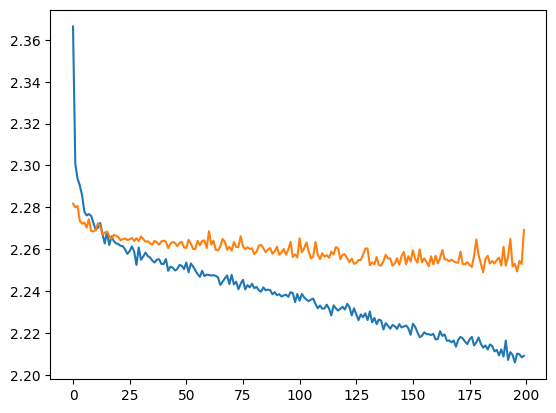

In [281]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])

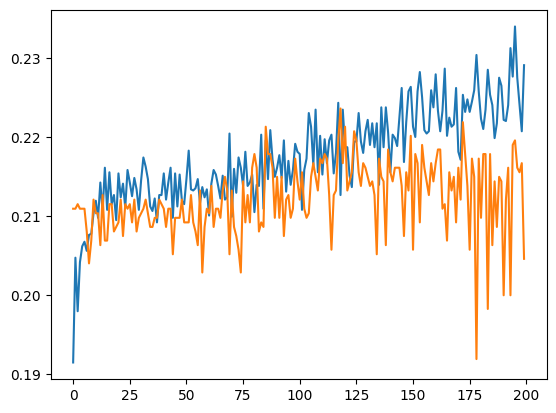

In [282]:
plt.plot(history.history['categorical_accuracy'])
plt.plot(history.history['val_categorical_accuracy'])

In [283]:
# model_conv_tqidf.save("model_conv_tqidf.keras")
loaded_model_conv_tqidf = tf.keras.models.load_model("model_conv_tqidf.keras")

In [284]:
import gc
gc.collect()

4352

In [286]:
from keras.metrics import categorical_accuracy

preds_train = model_conv_tqidf.predict(X_tfidf_net)
c_train = categorical_accuracy(Y_net, preds_train).numpy()
print("Dokładność na zbiorze treningowym wynosi: ", c_train.sum()/c_train.shape[0])

preds_test = model_conv_tqidf.predict(X_tfidf_net_test)
c_test = categorical_accuracy(Y_net_test, preds_test).numpy()
print("Dokładność na zbiorze testowym wynosi: ", c_test.sum()/c_test.shape[0])

217/217 [==============================] - 1s 3ms/step
Dokładność na zbiorze treningowym wynosi:  0.2250720461095101
55/55 [==============================] - 0s 2ms/step
Dokładność na zbiorze testowym wynosi:  0.20461095100864554


Bayes

In [129]:
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import accuracy_score, f1_score

In [116]:
X_tfidf_net = X_tfidf.toarray()
X_tfidf_net_test = X_tfidf_test.toarray()

import tensorflow.keras.utils as ku
Y_net = ku.to_categorical(Y, 16)
Y_net_test = ku.to_categorical(Y_test, 16)

In [163]:
#parametr C
acc_s = []
for a in [0.05, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1, 1.1, 1.2]:
    mb=MultinomialNB(alpha=a)
    mb.fit(X_tfidf_net, Y) #uwaga, inne dane
    p = mb.predict(X_tfidf_net_test)
    acc_s.append((p == Y_test).sum()/Y_test.shape[0])

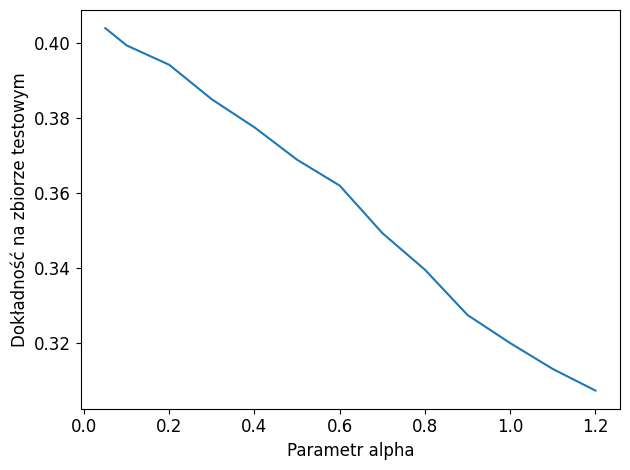

In [164]:
plt.plot([0.05, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1, 1.1, 1.2], acc_s)
plt.xlabel('Parametr alpha', fontsize=12)
plt.ylabel('Dokładność na zbiorze testowym', fontsize=12)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.tight_layout()
plt.savefig('bayes_alpha.png')

In [130]:
model_bayes = MultinomialNB(alpha=0.1).fit(X_tfidf_net, Y)

In [133]:
preds_test = model_bayes.predict(X_tfidf_net_test)

print("Dokładność: ", accuracy_score(Y_test, preds_test))
print("\nWskaźnik F1 dla poszczególnych klas: \n", f1_score(Y_test, preds_test, average=None))  #uwaga, wiele klas ma 0
print("\nWskaźnik F1 po uśrednieniu: ", f1_score(Y_test, preds_test, average='macro'))

Dokładność:  0.3994236311239193

Wskaźnik F1 dla poszczególnych klas: 
 [0.42833608 0.18934911 0.50782609 0.38905775 0.         0.
 0.49658314 0.13513514 0.         0.         0.         0.
 0.         0.         0.         0.        ]

Wskaźnik F1 po uśrednieniu:  0.13414295674143584


In [134]:
#zbiór treningowy
preds_train = model_bayes.predict(X_tfidf_net)

print("Dokładność: ", accuracy_score(Y, preds_train))
print("\nWskaźnik F1 dla poszczególnych klas: \n", f1_score(Y, preds_train, average=None))
print("\nWskaźnik F1 po uśrednieniu: ", f1_score(Y, preds_train, average='macro'))

Dokładność:  0.5361671469740634

Wskaźnik F1 dla poszczególnych klas: 
 [0.59611574 0.43085106 0.67407737 0.65039578 0.12182741 0.
 0.56505421 0.37869822 0.07111111 0.25723473 0.02962963 0.11494253
 0.         0.         0.0625     0.        ]

Wskaźnik F1 po uśrednieniu:  0.24702736182349888


XGBoost

In [135]:
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, f1_score

In [136]:
model_xgboost=XGBClassifier()
model_xgboost.fit(X_tfidf, Y)   #4 minuty

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, objective='multi:softprob', ...)

In [137]:
model_xgboost.objective, model_xgboost.device, model_xgboost.tree_method, model_xgboost.sampling_method, model_xgboost.booster

('multi:softprob', None, None, None, None)

In [138]:
preds = model_xgboost.predict(X_tfidf_test)

print("Dokładność: ", accuracy_score(Y_test, preds))
print("\nWskaźnik F1 dla poszczególnych klas: \n", f1_score(Y_test, preds, average=None))  #dobre wyniki
print("\nWskaźnik F1 po uśrednieniu: ", f1_score(Y_test, preds, average='macro'))

Dokładność:  0.69164265129683

Wskaźnik F1 dla poszczególnych klas: 
 [0.69983416 0.640625   0.7412844  0.71889401 0.53521127 0.56666667
 0.73975904 0.67193676 0.57425743 0.70676692 0.50909091 0.62686567
 0.32       0.15384615 0.33333333 0.5       ]

Wskaźnik F1 po uśrednieniu:  0.5648982322290749


In [140]:
#zbiór treningowy
preds = model_xgboost.predict(X_tfidf)

print("Dokładność: ", accuracy_score(Y, preds))
print("\nWskaźnik F1 dla poszczególnych klas: \n", f1_score(Y, preds, average=None))  #dość dziwne, przeuczenie?
print("\nWskaźnik F1 po uśrednieniu: ", f1_score(Y, preds, average='macro'))

Dokładność:  1.0

Wskaźnik F1 dla poszczególnych klas: 
 [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]

Wskaźnik F1 po uśrednieniu:  1.0


In [ ]:
#https://miroslawmamczur.pl/czym-jest-wzmocnienie-gradientowe-gradient-boosting-i-dlaczego-jest-taki-dobry/
# prosty opis kluczowych parametrów

#https://www.analyticsvidhya.com/blog/2016/03/complete-guide-parameter-tuning-xgboost-with-codes-python/
# samouczek

# learning_rate / eta [default=0.3] 
# max_depth [default=6] 
# n_estimators
# min_child_weight
# gamma [default=0]
# seed  [default=0] 

# subsample [default=1] 
# colsample_bytree [default=1] 
# colsample_bylevel [default=1]
# max_delta_step [default=0] 

# alpha [default=0]
# lambda [default=1] 

In [243]:
max_dep = [3, 6, 9] 
lamb = [0.1, 0.5, 1]

acc_s = {}
for md in max_dep:
    for l in lamb:
        print("Trening modelu o max_depth = ", md, " i lambda = ", l)
        xgb=XGBClassifier(max_depth = md, reg_lambda = l)
        xgb.fit(X_tfidf, Y)   #około 4 minut
        p = xgb.predict(X_tfidf_test)
        acc_s[(md, l)] = accuracy_score(Y_test, p)

Trening modelu o max_depth =  3  i lambda =  0.1
Trening modelu o max_depth =  3  i lambda =  0.5
Trening modelu o max_depth =  3  i lambda =  1
Trening modelu o max_depth =  6  i lambda =  0.1
Trening modelu o max_depth =  6  i lambda =  0.5
Trening modelu o max_depth =  6  i lambda =  1
Trening modelu o max_depth =  9  i lambda =  0.1
Trening modelu o max_depth =  9  i lambda =  0.5
Trening modelu o max_depth =  9  i lambda =  1


In [244]:
acc_s

{(3, 0.1): 0.6737752161383286,
 (3, 0.5): 0.6783861671469741,
 (3, 1): 0.6795389048991355,
 (6, 0.1): 0.6680115273775216,
 (6, 0.5): 0.6772334293948127,
 (6, 1): 0.69164265129683,
 (9, 0.1): 0.6737752161383286,
 (9, 0.5): 0.6806916426512968,
 (9, 1): 0.6818443804034582}

In [245]:
max(acc_s, key=acc_s.get) #zatem domyślne wartości parametrów najlepiej się sprawdzają

(6, 1)

In [240]:
# # #próba strojenia hiperparametrów zajmuje bardzo dużo czasu, a przerzucenie na kartę graficzną wyrzuca nagle bardzo słabą dokładność
# from sklearn.model_selection import GridSearchCV

# model = XGBClassifier()
# grid_vals = {'max_depth': [3, 6, 9], 'lambda': [0.1, 0.5, 1]}
# grid_lr = GridSearchCV(estimator=model, param_grid=grid_vals, scoring='accuracy', 
#                        cv=4, refit=True, return_train_score=True) 
# grid_lr.fit(X_tfidf, Y, verbose=1)  #uwaga, cv jedynie na zbiorze treningowym

# #9 zestawów parametrów * 4 walidacje * 4 minuty = 144 minuty (2.5 h)

In [ ]:
# grid_lr.cv_results_, grid_lr.best_params_

In [ ]:
# preds = grid_lr.best_estimator_.predict(X_tfidf_test)

In [177]:
# #próba znajdywania modelu i strojenia hiperparametrów za pomocą algorytmu genetycznego - problem z biblioteką
 
# from tpot import TPOTClassifier
# tpot_clf = TPOTClassifier(generations=5, population_size=20, 
#                           verbosity=2, offspring_size=20, scoring='accuracy', cv=5)
# #Training and prediction
# tpot_clf.fit(X_tfidf, Y)
# tpot_pred = tpot_clf.score(X_tfidf_test, Y_test)

Prosty RNN

TF-IDF nie bierze pod uwagę kolejności słów, dlatego z reguły nie jest to dobry wybór.

In [63]:
#prosty model rekurencyjny

in1 = tf.keras.layers.Input(shape=(5000, 1))
gru = tf.keras.layers.GRU(128, name='latent_layer')(in1)
bn = tf.keras.layers.BatchNormalization()(gru)
dense = tf.keras.layers.Dense(32, activation="relu")(bn)
drop = tf.keras.layers.Dropout(0.3)(dense)
d1   = tf.keras.layers.Dense(16, activation='softmax')(drop)

model_rnn_tqidf = tf.keras.Model(
	inputs=[in1], 
	outputs=[d1]
)

model_rnn_tqidf.compile(loss="categorical_crossentropy", optimizer="adam", metrics=["categorical_accuracy"])

print(model_rnn_tqidf.summary())

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 5000, 1)]         0         
                                                                 
 latent_layer (GRU)          (None, 128)               50304     
                                                                 
 batch_normalization (BatchN  (None, 128)              512       
 ormalization)                                                   
                                                                 
 dense (Dense)               (None, 32)                4128      
                                                                 
 dropout (Dropout)           (None, 32)                0         
                                                                 
 dense_1 (Dense)             (None, 16)                528       
                                                             

In [64]:
history = model_rnn_tqidf.fit(X_tfidf_net, Y_net, epochs=200, verbose=1, validation_data=(X_tfidf_net_test, Y_net_test))
#niezbyt obiecujące skoki

Epoch 1/200
217/217 [==============================] - 56s 248ms/step - loss: 2.4576 - categorical_accuracy: 0.1991 - val_loss: 2.2940 - val_categorical_accuracy: 0.2110
Epoch 2/200
217/217 [==============================] - 54s 248ms/step - loss: 2.3234 - categorical_accuracy: 0.1986 - val_loss: 4.4338 - val_categorical_accuracy: 0.2110
Epoch 3/200
217/217 [==============================] - 53s 245ms/step - loss: 2.3163 - categorical_accuracy: 0.1951 - val_loss: 9.0759 - val_categorical_accuracy: 0.1695
Epoch 4/200
217/217 [==============================] - 52s 242ms/step - loss: 2.3088 - categorical_accuracy: 0.2037 - val_loss: 22.2717 - val_categorical_accuracy: 0.0236
Epoch 5/200
217/217 [==============================] - 52s 240ms/step - loss: 2.3024 - categorical_accuracy: 0.2030 - val_loss: 25.1438 - val_categorical_accuracy: 0.2110
Epoch 6/200
217/217 [==============================] - 53s 245ms/step - loss: 2.2963 - categorical_accuracy: 0.2086 - val_loss: 48.5746 - val_catego

KeyboardInterrupt: 

### Modelowanie - BoW + TF-IDF, n-gram = (1, 2)

In [286]:
data_test_bow_gram = df_test
data_train_bow_gram = df_train

In [287]:
data_test_bow_gram['post_joined'] = data_test_bow_gram.apply(lambda x: " ".join(x.post_cleaned), axis=1)
data_train_bow_gram['post_joined'] = data_train_bow_gram.apply(lambda x: " ".join(x.post_cleaned), axis=1)

In [288]:
#Bag of Words - z n-gramami (1 i 2-wyrazowymi)

from sklearn.feature_extraction.text import CountVectorizer

vectorizer2 = CountVectorizer(max_features=5000, ngram_range=(1,2))  #jeśli max_features niezdefiniowane - cały słownik
X_bow_gram = vectorizer2.fit_transform(data_train_bow_gram.post_joined)   #fit & transform
X_bow_gram.shape #ponad 6 000 postów, około 5 000 słów

(6940, 5000)

In [289]:
vectorizer2.vocabulary_   #pojedyncze słowa oraz zwroty

{'care': 509,
 'others': 2931,
 'would': 4923,
 'never': 2749,
 'get': 1712,
 'period': 3035,
 'want': 4786,
 'odd': 2854,
 'looking': 2451,
 'older': 2881,
 'mention': 2605,
 'health': 1895,
 'involved': 2158,
 'also': 135,
 'ellipsis': 1010,
 'right': 3886,
 'handed': 1856,
 'though': 4532,
 'activities': 60,
 'number': 2809,
 'hands': 1858,
 'using': 4734,
 'left': 2329,
 'hand': 1854,
 'stick': 4280,
 'etc': 1327,
 'yes': 4982,
 'people': 2993,
 'said': 3927,
 'differences': 896,
 'personality': 3457,
 'behavior': 354,
 'males': 2525,
 'females': 1549,
 'product': 3614,
 'factors': 1475,
 'even': 1330,
 'areas': 229,
 'yeah': 4964,
 'pretty': 3585,
 'much': 2691,
 'agree': 101,
 'guys': 1834,
 'something': 4175,
 'really': 3761,
 'counts': 746,
 'otherwise': 2935,
 'real': 3749,
 'need': 2736,
 'think': 4492,
 'worry': 4916,
 'type': 4667,
 'reserved': 3863,
 'calm': 495,
 'organized': 2927,
 'non': 2785,
 'curious': 783,
 'primary': 3596,
 'extroversion': 1459,
 'results': 3879,
 

In [290]:
#porównanie n-gramów

from sklearn.feature_extraction.text import CountVectorizer
v = CountVectorizer(max_features=5000, ngram_range=(1,1))  #porównanie z n-gramem 1
g = v.fit_transform(data_train_bow_gram.post_joined)   #fit & transform


import sys
np.set_printoptions(threshold=sys.maxsize)
print(X_bow_gram.toarray()[0] == g.toarray()[0])

[ True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True False  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
 False  True  True  True False  True  True  True  True  True  True  True
  True  True False  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True False  True
  True  True  True False False False  True False  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True False False False  True  True  True  True  True  True
 False  True  True  True  True  True False False  True  True False False
  True  True  True  True  True  True  True  True  T

In [291]:
#TF-IDF

from sklearn.feature_extraction.text import TfidfTransformer

tfidf_transformer2 = TfidfTransformer()
X_tfidf_gram = tfidf_transformer2.fit_transform(X_bow_gram)
X_tfidf_gram.shape

(6940, 5000)

In [292]:
Y_gram = data_train_bow_gram.class_no

In [293]:
X_bow_test_gram = vectorizer2.transform(data_test_bow_gram.post_joined)   #transform
X_tfidf_test_gram = tfidf_transformer2.transform(X_bow_test_gram)         #transform
X_tfidf_test_gram.shape

(1735, 5000)

In [294]:
Y_test_gram = data_test_bow_gram.class_no

Regresja logistyczna

In [295]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, f1_score

In [296]:
model_log2=LogisticRegression(C=1, n_jobs=-1, multi_class='multinomial')
model_log2.fit(X_tfidf_gram, Y_gram)

LogisticRegression(C=1, multi_class='multinomial', n_jobs=-1)

In [297]:
preds = model_log2.predict(X_tfidf_test_gram)

print("Dokładność: ", accuracy_score(Y_test_gram, preds))
print("\nWskaźnik F1 dla poszczególnych klas: \n", f1_score(Y_test_gram, preds, average=None))  #uwaga, najmniej liczne klasy mają 0
print("\nWskaźnik F1 po uśrednieniu: ", f1_score(Y_test_gram, preds, average='macro'))

Dokładność:  0.6236311239193083

Wskaźnik F1 dla poszczególnych klas: 
 [0.67438017 0.61603376 0.67868852 0.67120181 0.25925926 0.1
 0.6892895  0.60833333 0.23880597 0.43298969 0.38095238 0.24489796
 0.         0.         0.         0.        ]

Wskaźnik F1 po uśrednieniu:  0.3496770221501786


In [298]:
#zbiór treningowy
preds = model_log2.predict(X_tfidf_gram)

print("Dokładność: ", accuracy_score(Y_gram, preds))
print("\nWskaźnik F1 dla poszczególnych klas: \n", f1_score(Y_gram, preds, average=None))  #uwaga, najmniej liczne klasy mają 0
print("\nWskaźnik F1 po uśrednieniu: ", f1_score(Y_gram, preds, average='macro'))

Dokładność:  0.7275216138328531

Wskaźnik F1 dla poszczególnych klas: 
 [0.78064516 0.73170732 0.78153057 0.76763259 0.48387097 0.23863636
 0.77959301 0.70717131 0.43986254 0.6893424  0.35928144 0.40566038
 0.12987013 0.         0.         0.        ]

Wskaźnik F1 po uśrednieniu:  0.4559252610465304


Liniowy klasyfikator SVM

In [159]:
from sklearn.svm import LinearSVC
from sklearn.metrics import accuracy_score, f1_score

In [299]:
model_linear_svc2=LinearSVC(C=0.4, dual='auto', multi_class='ovr')
model_linear_svc2.fit(X_tfidf_gram, Y_gram)

LinearSVC(C=0.4, dual='auto')

In [300]:
preds = model_linear_svc2.predict(X_tfidf_test_gram)

print("Dokładność: ", accuracy_score(Y_test_gram, preds))
print("\nWskaźnik F1 dla poszczególnych klas: \n", f1_score(Y_test_gram, preds, average=None))  #dobre wyniki
print("\nWskaźnik F1 po uśrednieniu: ", f1_score(Y_test_gram, preds, average='macro'))

Dokładność:  0.6818443804034582

Wskaźnik F1 dla poszczególnych klas: 
 [0.68907563 0.66666667 0.71731449 0.70666667 0.56338028 0.4
 0.74647887 0.68725869 0.42352941 0.63414634 0.6        0.47619048
 0.34782609 0.18181818 0.22222222 0.36363636]

Wskaźnik F1 po uśrednieniu:  0.5266381485911309


In [301]:
#zbiór treningowy
preds = model_linear_svc2.predict(X_tfidf_gram)

print("Dokładność: ", accuracy_score(Y_gram, preds))
print("\nWskaźnik F1 dla poszczególnych klas: \n", f1_score(Y_gram, preds, average=None))  #dobre wyniki
print("\nWskaźnik F1 po uśrednieniu: ", f1_score(Y_gram, preds, average='macro'))

Dokładność:  0.8955331412103746

Wskaźnik F1 dla poszczególnych klas: 
 [0.90147992 0.88888889 0.90900563 0.89965792 0.88690476 0.80754717
 0.90184645 0.87749288 0.87064677 0.93084112 0.90039841 0.8802589
 0.8372093  0.79365079 0.80769231 0.82758621]

Wskaźnik F1 po uśrednieniu:  0.8700692139962485


Bayes

In [175]:
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import accuracy_score, f1_score

In [302]:
X_tfidf_net_gram = X_tfidf_gram.toarray()
X_tfidf_net_test_gram = X_tfidf_test_gram.toarray()

In [319]:
model_bayes2 = MultinomialNB(alpha=0.1).fit(X_tfidf_net_gram, Y_gram)

In [320]:
preds_test = model_bayes2.predict(X_tfidf_net_test_gram)

print("Dokładność: ", accuracy_score(Y_test_gram, preds_test))
print("\nWskaźnik F1 dla poszczególnych klas: \n", f1_score(Y_test_gram, preds_test, average=None))  #uwaga, bardzo wiele klas ma 0
print("\nWskaźnik F1 po uśrednieniu: ", f1_score(Y_test_gram, preds_test, average='macro'))

Dokładność:  0.4328530259365994

Wskaźnik F1 dla poszczególnych klas: 
 [0.47619048 0.25136612 0.53177258 0.48235294 0.         0.
 0.51694247 0.22619048 0.         0.         0.         0.
 0.         0.         0.         0.        ]

Wskaźnik F1 po uśrednieniu:  0.15530094146350756


In [321]:
#zbiór treningowy
preds_train = model_bayes2.predict(X_tfidf_net_gram)

print("Dokładność: ", accuracy_score(Y_gram, preds_train))
print("\nWskaźnik F1 dla poszczególnych klas: \n", f1_score(Y_gram, preds_train, average=None))  #uwaga, kilka klas ma 0
print("\nWskaźnik F1 po uśrednieniu: ", f1_score(Y_gram, preds_train, average='macro'))

Dokładność:  0.5455331412103747

Wskaźnik F1 dla poszczególnych klas: 
 [0.60813008 0.45283019 0.64713165 0.64546057 0.13131313 0.
 0.58260105 0.47457627 0.14529915 0.23452769 0.07246377 0.08187135
 0.02777778 0.         0.         0.        ]

Wskaźnik F1 po uśrednieniu:  0.2564989172104202


XGBoost

In [181]:
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, f1_score

In [182]:
model_xgboost2=XGBClassifier()   #domyślne parametry
model_xgboost2.fit(X_tfidf_gram, Y_gram)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, objective='multi:softprob', ...)

In [183]:
preds = model_xgboost2.predict(X_tfidf_test_gram)

print("Dokładność: ", accuracy_score(Y_test_gram, preds))
print("\nWskaźnik F1 dla poszczególnych klas: \n", f1_score(Y_test_gram, preds, average=None))  #dobre wyniki
print("\nWskaźnik F1 po uśrednieniu: ", f1_score(Y_test_gram, preds, average='macro'))

Dokładność:  0.684149855907781

Wskaźnik F1 dla poszczególnych klas: 
 [0.67874794 0.65168539 0.73605948 0.71559633 0.5915493  0.51724138
 0.73341375 0.651341   0.55769231 0.72440945 0.54166667 0.53968254
 0.37037037 0.15384615 0.22222222 0.5       ]

Wskaźnik F1 po uśrednieniu:  0.5553452672400039


In [184]:
#zbiór treningowy
preds = model_xgboost2.predict(X_tfidf_gram)

print("Dokładność: ", accuracy_score(Y_gram, preds))
print("\nWskaźnik F1 dla poszczególnych klas: \n", f1_score(Y_gram, preds, average=None))  #przeuczenie?
print("\nWskaźnik F1 po uśrednieniu: ", f1_score(Y_gram, preds, average='macro'))

Dokładność:  1.0

Wskaźnik F1 dla poszczególnych klas: 
 [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]

Wskaźnik F1 po uśrednieniu:  1.0


### Modelowanie - BoW + TF-IDF, n-gram = (2, 2)

In [322]:
data_test_bow_gram = df_test
data_train_bow_gram = df_train

data_test_bow_gram['post_joined'] = data_test_bow_gram.apply(lambda x: " ".join(x.post_cleaned), axis=1)
data_train_bow_gram['post_joined'] = data_train_bow_gram.apply(lambda x: " ".join(x.post_cleaned), axis=1)

In [323]:
#Bag of Words - z n-gramami (2-wyrazowymi)

from sklearn.feature_extraction.text import CountVectorizer

vectorizer3 = CountVectorizer(max_features=5000, ngram_range=(2,2))  #jeśli max_features niezdefiniowane - cały słownik
X_bow_gram = vectorizer3.fit_transform(data_train_bow_gram.post_joined)   #fit & transform
X_bow_gram.shape #ponad 6 000 postów, około 5 000 słów

(6940, 5000)

In [324]:
vectorizer3.vocabulary_

{'would never': 4917,
 'never get': 2459,
 'period care': 2866,
 'involved period': 1859,
 'period also': 2809,
 'also ellipsis': 70,
 'ellipsis period': 809,
 'period right': 3348,
 'etc period': 1063,
 'period yes': 3567,
 'yes period': 4985,
 'period people': 3286,
 'people said': 2757,
 'ellipsis yeah': 950,
 'yeah pretty': 4962,
 'pretty much': 3650,
 'guys period': 1613,
 'period something': 3406,
 'something really': 4153,
 'something period': 4151,
 'period otherwise': 3277,
 'ellipsis fun': 668,
 'period whatever': 3531,
 'may period': 2304,
 'period certain': 2869,
 'enjoy period': 1028,
 'feel way': 1304,
 'cats period': 288,
 'period maybe': 3205,
 'ellipsis talking': 882,
 'type period': 4636,
 'period like': 3164,
 'ellipsis number': 795,
 'question_mark pretty': 3763,
 'much anything': 2398,
 'period things': 3464,
 'period number': 3258,
 'number ellipsis': 2526,
 'ellipsis would': 942,
 'myers briggs': 2422,
 'personality period': 3589,
 'period science': 3361,
 'great

Porównanie BoW

In [325]:
print(vectorizer.ngram_range)
l = list(vectorizer.vocabulary_.keys())
l.sort(key=lambda x: len(x.split()), reverse=True)

ran = [0, 1, 2, 3, 4, -20, -19, -18, -17, -16]
for r in ran:
    print(l[r])

(1, 1)
care
others
tattoos
would
never
40
fox
richard
encouraging
frequency


In [326]:
print(vectorizer2.ngram_range)
l = list(vectorizer2.vocabulary_.keys())
l.sort(key=lambda x: len(x.split()), reverse=True)

ran = [0, 1, 15, 125, 213, -20, -19, -18, -17, -16]
for r in ran:
    print(l[r])

(1, 2)
would never
never get
something really
pretty sure
another one
wings
sorta
pointing
gosh
label


In [327]:
print(vectorizer3.ngram_range)
l = list(vectorizer3.vocabulary_.keys())
l.sort(key=lambda x: len(x.split()), reverse=True)

ran = range(500, 560, 2)
for r in ran:
    print(l[r])

(2, 2)
also tend
new people
though ellipsis
star wars
year ellipsis
guess ellipsis
reason period
really mean
long ellipsis
mean period
ellipsis best
place period
ellipsis especially
typing people
period blushed
dating period
find one
relationship ellipsis
come conclusion
period made
period okay
period specifically
making friends
period enough
ellipsis absolutely
period find
people could
ellipsis probably
period understand
people meet


In [328]:
#TF-IDF

from sklearn.feature_extraction.text import TfidfTransformer

tfidf_transformer3 = TfidfTransformer()
X_tfidf_gram = tfidf_transformer3.fit_transform(X_bow_gram)

Y_gram = data_train_bow_gram.class_no

In [329]:
X_bow_test_gram = vectorizer3.transform(data_test_bow_gram.post_joined)   #transform
X_tfidf_test_gram = tfidf_transformer3.transform(X_bow_test_gram)         #transform

Y_test_gram = data_test_bow_gram.class_no

Regresja logistyczna

In [330]:
from sklearn.linear_model import LogisticRegression 
from sklearn.metrics import accuracy_score, f1_score

In [331]:
model_log3=LogisticRegression(C=1, n_jobs=-1, multi_class='multinomial')
model_log3.fit(X_tfidf_gram, Y_gram)

LogisticRegression(C=1, multi_class='multinomial', n_jobs=-1)

In [332]:
preds = model_log3.predict(X_tfidf_test_gram)

print("Dokładność: ", accuracy_score(Y_test_gram, preds))
print("\nWskaźnik F1 dla poszczególnych klas: \n", f1_score(Y_test_gram, preds, average=None))  #uwaga, wiele klas ma 0
print("\nWskaźnik F1 po uśrednieniu: ", f1_score(Y_test_gram, preds, average='macro'))

Dokładność:  0.4904899135446686

Wskaźnik F1 dla poszczególnych klas: 
 [0.52515723 0.45045045 0.5568369  0.51748252 0.         0.
 0.57817109 0.42790698 0.07142857 0.2195122  0.         0.13636364
 0.         0.         0.         0.        ]

Wskaźnik F1 po uśrednieniu:  0.21770684840886262


In [334]:
#zbiór treningowy
preds = model_log3.predict(X_tfidf_gram)

print("Dokładność: ", accuracy_score(Y_gram, preds))
print("\nWskaźnik F1 dla poszczególnych klas: \n", f1_score(Y_gram, preds, average=None))  #uwaga, wiele klas ma 0
print("\nWskaźnik F1 po uśrednieniu: ", f1_score(Y_gram, preds, average='macro'))

Dokładność:  0.7178674351585015

Wskaźnik F1 dla poszczególnych klas: 
 [0.78787879 0.77333333 0.78353141 0.78346028 0.34080717 0.06369427
 0.76088743 0.7248731  0.24193548 0.51891892 0.11347518 0.26455026
 0.         0.         0.         0.        ]

Wskaźnik F1 po uśrednieniu:  0.38483410155587117


Liniowy klasyfikator SVM

In [335]:
from sklearn.svm import LinearSVC
from sklearn.metrics import accuracy_score, f1_score

In [336]:
model_linear_svc3=LinearSVC(C=0.4, dual='auto', multi_class='ovr')
model_linear_svc3.fit(X_tfidf_gram, Y_gram)

LinearSVC(C=0.4, dual='auto')

In [339]:
preds = model_linear_svc3.predict(X_tfidf_test_gram)

print("Dokładność: ", accuracy_score(Y_test_gram, preds))
print("\nWskaźnik F1 dla poszczególnych klas: \n", f1_score(Y_test_gram, preds, average=None))  #uwaga, najmniej liczne klas mają 0
print("\nWskaźnik F1 po uśrednieniu: ", f1_score(Y_test_gram, preds, average='macro'))

Dokładność:  0.5025936599423632

Wskaźnik F1 dla poszczególnych klas: 
 [0.51456311 0.46616541 0.55821918 0.50569476 0.32142857 0.04545455
 0.59226519 0.4789916  0.22222222 0.38181818 0.24390244 0.2745098
 0.10526316 0.         0.         0.        ]

Wskaźnik F1 po uśrednieniu:  0.29440613568782664


In [340]:
#zbiór treningowy
preds = model_linear_svc3.predict(X_tfidf_gram)

print("Dokładność: ", accuracy_score(Y_gram, preds))
print("\nWskaźnik F1 dla poszczególnych klas: \n", f1_score(Y_gram, preds, average=None))  #dobre wyniki
print("\nWskaźnik F1 po uśrednieniu: ", f1_score(Y_gram, preds, average='macro'))

Dokładność:  0.9445244956772334

Wskaźnik F1 dla poszczególnych klas: 
 [0.94420964 0.95361781 0.94352159 0.95040369 0.95505618 0.9375
 0.93398693 0.94586895 0.92345679 0.96435272 0.9486166  0.96529968
 0.97101449 0.89855072 1.         0.91803279]

Wskaźnik F1 po uśrednieniu:  0.9470930366739183


Bayes

In [201]:
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import accuracy_score, f1_score

In [341]:
X_tfidf_net_gram = X_tfidf_gram.toarray()
X_tfidf_net_test_gram = X_tfidf_test_gram.toarray()

In [342]:
model_bayes3 = MultinomialNB(alpha=0.1).fit(X_tfidf_gram, Y_gram)

In [343]:
preds_test = model_bayes3.predict(X_tfidf_net_test_gram)

print("Dokładność: ", accuracy_score(Y_test_gram, preds_test))
print("\nWskaźnik F1 dla poszczególnych klas: \n", f1_score(Y_test_gram, preds_test, average=None))  #uwaga, bardzo wiele klas ma 0
print("\nWskaźnik F1 po uśrednieniu: ", f1_score(Y_test_gram, preds_test, average='macro'))

Dokładność:  0.4282420749279539

Wskaźnik F1 dla poszczególnych klas: 
 [0.45626072 0.27322404 0.52892562 0.44086022 0.         0.
 0.52475248 0.2688172  0.         0.         0.         0.
 0.         0.         0.         0.        ]

Wskaźnik F1 po uśrednieniu:  0.15580251741028656


In [344]:
#zbiór treningowy
preds_train = model_bayes3.predict(X_tfidf_net_gram)

print("Dokładność: ", accuracy_score(Y_gram, preds_train))
print("\nWskaźnik F1 dla poszczególnych klas: \n", f1_score(Y_gram, preds_train, average=None))  #uwaga, bardzo wiele klas ma 0
print("\nWskaźnik F1 po uśrednieniu: ", f1_score(Y_gram, preds_train, average='macro'))

Dokładność:  0.6551873198847262

Wskaźnik F1 dla poszczególnych klas: 
 [0.70938404 0.66127168 0.72013652 0.74183611 0.49392713 0.22222222
 0.65885226 0.60089686 0.32061069 0.57662338 0.35802469 0.31794872
 0.47311828 0.34782609 0.48780488 0.35      ]

Wskaźnik F1 po uśrednieniu:  0.5025302205710489


XGBoost

In [207]:
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, f1_score

In [208]:
model_xgboost3=XGBClassifier()   #domyślne parametry
model_xgboost3.fit(X_tfidf_gram, Y_gram)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, objective='multi:softprob', ...)

In [209]:
preds = model_xgboost3.predict(X_tfidf_test_gram)

print("Dokładność: ", accuracy_score(Y_test_gram, preds))
print("\nWskaźnik F1 dla poszczególnych klas: \n", f1_score(Y_test_gram, preds, average=None))  #uwaga, kilka klas ma 0
print("\nWskaźnik F1 po uśrednieniu: ", f1_score(Y_test_gram, preds, average='macro'))

Dokładność:  0.5279538904899136

Wskaźnik F1 dla poszczególnych klas: 
 [0.53642384 0.49180328 0.60988075 0.52112676 0.26229508 0.32
 0.59546926 0.56066946 0.25974026 0.39285714 0.20512821 0.25
 0.1        0.         0.22222222 0.        ]

Wskaźnik F1 po uśrednieniu:  0.3329760158456895


In [210]:
#zbiór treningowy
preds = model_xgboost3.predict(X_tfidf_gram)

print("Dokładność: ", accuracy_score(Y_gram, preds))
print("\nWskaźnik F1 dla poszczególnych klas: \n", f1_score(Y_gram, preds, average=None))  #przeuczenie?
print("\nWskaźnik F1 po uśrednieniu: ", f1_score(Y_gram, preds, average='macro'))

Dokładność:  0.9995677233429395

Wskaźnik F1 dla poszczególnych klas: 
 [0.99957465 1.         0.99952038 0.99942759 1.         1.
 0.99897716 1.         1.         1.         1.         1.
 1.         1.         1.         1.        ]

Wskaźnik F1 po uśrednieniu:  0.9998437362142591


### Modelowanie - Tokenizer & Embedding & RNN lub Tokenizer & Embedding & Attention

In [76]:
data_test_emb = df_test
data_train_emb = df_train

In [77]:
data_test_emb.post_cleaned

3669    [[NUMBER], tight, inbreeding, used, identify, ...
2523    [absolutely, feel, home, stage, [PERIOD], prof...
8117    [indeed, [EXCLAMATION_MARK], critical-mass, am...
180     [things, intelligent, persc, chatters, talk, [...
7092    [getting, along, entp, mostly, due, entp, show...
                              ...                        
1383    [[NUMBER], average, female, scientist, also, c...
2374    [separate, rest, world, think, know, [PERIOD],...
4422    [sure, [ELLIPSIS], throw, [NUMBER], cents, [PE...
8335    [[LINK], actually, listening, head, [ELLIPSIS]...
3572    [haha, yes, [EXCLAMATION_MARK], definitely, pr...
Name: post_cleaned, Length: 1735, dtype: object

Tokenizacja

In [78]:
#tokenizer dla czystego i okrojonego tekstu, czysto na potrzeby zamiany postów na sekwencje liczbowe
tokenizer = Tokenizer(num_words=100000)  #okrojone niecałe 10 000 słów
tokenizer.fit_on_texts(data_train_emb.post_cleaned)  #słownik tworzony na podstawie zbioru treningowego
total_words = len(tokenizer.word_index)
print("Liczba słów:", total_words)

Liczba słów: 108144


In [79]:
for i in range(1, 7):
    if i == 3 or i == 5:
        print(i, ":", tokenizer.index_word[i], '\t\t', i+6, ":", tokenizer.index_word[i+6])
    else:
        print(i, ":", tokenizer.index_word[i], '\t\t\t', i+6, ":", tokenizer.index_word[i+6])
    
print('\t\t\t\t...')

1 : [period] 			 7 : think
2 : [ellipsis] 			 8 : people
3 : [question_mark] 		 9 : one
4 : [number] 			 10 : know
5 : [exclamation_mark] 		 11 : really
6 : like 			 12 : would
				...


In [80]:
#zamiana tekstu na reprezentację liczbową
data_train_emb['post_tokenized'] = data_train_emb.apply(lambda x: tokenizer.texts_to_sequences([x.post_cleaned])[0], axis=1)

In [81]:
data_train_emb[["post_cleaned", "post_tokenized"]].head()

,post_cleaned,post_tokenized
2710,"[care, others, tattoos, would, never, get, tat...","[164, 92, 3977, 12, 36, 14, 3561, 1, 164, 26, ..."
5029,"[momento, mori, [PERIOD], often, make, mistake...","[37877, 27522, 1, 131, 34, 1355, 412, 669, 21,..."
3413,"[thoughts, erik, better, known, phantom, opera...","[263, 15179, 82, 505, 6910, 4196, 43, 155, 841..."
2166,"[said, zero, flexibility, little, time, dating...","[58, 2189, 8073, 77, 16, 473, 1, 45, 69, 16593..."
8288,"[glad, liked, [PERIOD], also, heard, quote, [P...","[485, 486, 1, 28, 377, 582, 1, 6, 39, 330, 93,..."


In [82]:
max_tokens_len = max(data_train_emb.apply(lambda x: len(x.post_tokenized), axis=1))  #najdłuższy post
max_tokens_len

1081

In [83]:
l = data_train_emb.apply(lambda x: len(x.post_tokenized), axis=1).tolist()
l.sort()
np.quantile(l, [0, 0.25, 0.5, 0.75, 0.95, 1])

#95 procent próbek ma długość poniżej 945, dlatego padding do maksymalnej długości (1081) wygeneruje wiele zer
#mimo tego warto wypróbować ten prosty schemat

array([   4.  ,  641.  ,  761.  ,  850.  ,  944.05, 1081.  ])

Padding

In [84]:
import tensorflow.keras.utils as ku

#padding
X_emb = pad_sequences(data_train_emb.post_tokenized, maxlen = max_tokens_len, padding = 'pre')   #max_tokens_len-1?
#etykiety
Y_emb = data_train_emb.class_no
Y_emb = ku.to_categorical(Y_emb)

X_emb.shape, Y_emb.shape

((6940, 1081), (6940, 16))

In [85]:
data_test_emb['post_tokenized'] = data_test_emb.apply(lambda x: tokenizer.texts_to_sequences([x.post_cleaned])[0], axis=1)
X_emb_test = pad_sequences(data_test_emb.post_tokenized, maxlen = max_tokens_len, padding = 'pre')

Y_emb_test = data_test_emb.class_no

X_emb_test.shape, Y_emb_test.shape

((1735, 1081), (1735,))

RNN

In [86]:
#prosty model rekurencyjny

from keras.models import Sequential

model_rnn_emb = Sequential()
model_rnn_emb.add(tf.keras.layers.Embedding(input_dim = total_words + 1, output_dim = 64, input_length = max_tokens_len))  #+1, bo numeracja tokenów zaczyna się od 1, a nie od 0
model_rnn_emb.add(tf.keras.layers.GRU(512, name='latent_layer'))
model_rnn_emb.add(tf.keras.layers.BatchNormalization())
model_rnn_emb.add(tf.keras.layers.Dense(128, activation="relu"))
model_rnn_emb.add(tf.keras.layers.Dropout(0.3))
model_rnn_emb.add(tf.keras.layers.Dense(16, activation='softmax'))

model_rnn_emb.compile(loss="categorical_crossentropy", optimizer="adam", metrics=[tf.keras.metrics.CategoricalAccuracy()])
#domyślnie: Adam learning_rate=0.001

print(model_rnn_emb.summary())

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding (Embedding)       (None, 1081, 64)          6921280   
                                                                 
 latent_layer (GRU)          (None, 512)               887808    
                                                                 
 batch_normalization (BatchN  (None, 512)              2048      
 ormalization)                                                   
                                                                 
 dense (Dense)               (None, 128)               65664     
                                                                 
 dropout (Dropout)           (None, 128)               0         
                                                                 
 dense_1 (Dense)             (None, 16)                2064      
                                                        

In [87]:
history = model_rnn_emb.fit(X_emb, Y_emb, epochs=100, verbose=2, validation_data=(X_emb_test, ku.to_categorical(Y_emb_test)))

Epoch 1/100


217/217 - 28s - loss: 2.3988 - categorical_accuracy: 0.1785 - val_loss: 2.3058 - val_categorical_accuracy: 0.2110 - 28s/epoch - 130ms/step
Epoch 2/100
217/217 - 25s - loss: 1.9964 - categorical_accuracy: 0.3504 - val_loss: 6.3223 - val_categorical_accuracy: 0.0790 - 25s/epoch - 116ms/step
Epoch 3/100
217/217 - 25s - loss: 1.0711 - categorical_accuracy: 0.6736 - val_loss: 17.4258 - val_categorical_accuracy: 0.2110 - 25s/epoch - 116ms/step
Epoch 4/100
217/217 - 25s - loss: 0.3603 - categorical_accuracy: 0.8914 - val_loss: 13.1108 - val_categorical_accuracy: 0.2156 - 25s/epoch - 116ms/step
Epoch 5/100
217/217 - 25s - loss: 0.1446 - categorical_accuracy: 0.9563 - val_loss: 27.7424 - val_categorical_accuracy: 0.1510 - 25s/epoch - 116ms/step
Epoch 6/100
217/217 - 25s - loss: 0.0571 - categorical_accuracy: 0.9843 - val_loss: 11.8196 - val_categorical_accuracy: 0.1205 - 25s/epoch - 115ms/step
Epoch 7/100
217/217 - 25s - loss: 0.0398 - categorical_accuracy: 0.9892 - val_loss: 19.3583 - val_cate

Ewaluacja

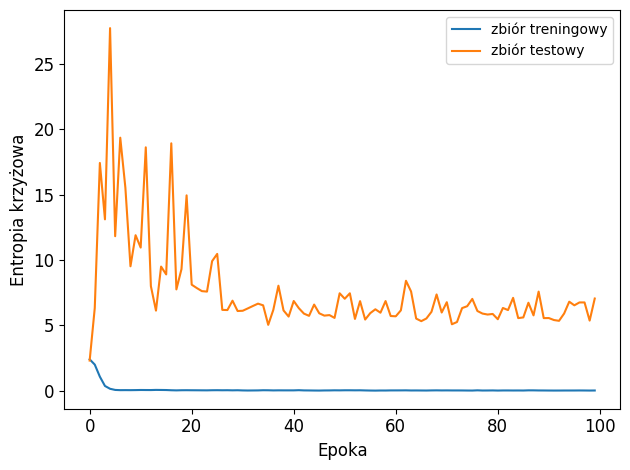

In [101]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.xlabel('Epoka', fontsize=12)
plt.ylabel('Entropia krzyżowa', fontsize=12)
plt.legend(['zbiór treningowy', 'zbiór testowy'])
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.tight_layout()
plt.savefig('model_rnn_emb_loss.png')

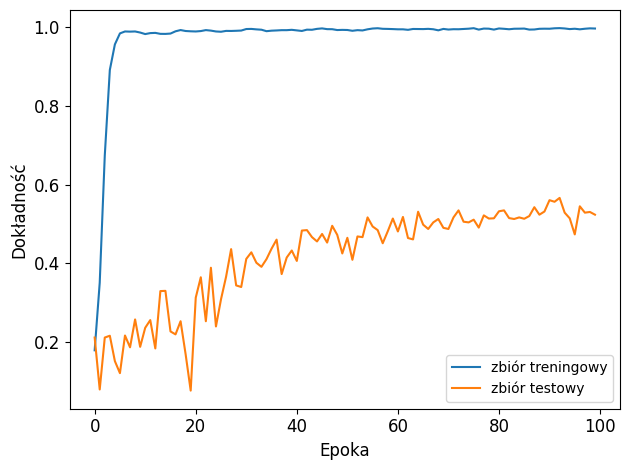

In [102]:
plt.plot(history.history['categorical_accuracy'])
plt.plot(history.history['val_categorical_accuracy'])
plt.xlabel('Epoka', fontsize=12)
plt.ylabel('Dokładność', fontsize=12)
plt.legend(['zbiór treningowy', 'zbiór testowy'])
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.tight_layout()
plt.savefig('model_rnn_emb_acc.png')

In [92]:
model_rnn_emb.save("model_rnn_emb.keras")
loaded_model_rnn_emb = tf.keras.models.load_model("model_rnn_emb.keras")

In [93]:
import gc
gc.collect()

12357

In [103]:
from keras.metrics import categorical_accuracy
from tensorflow_addons.metrics import F1Score

preds_test = model_rnn_emb.predict(X_emb_test, verbose=0)
c_test = categorical_accuracy(ku.to_categorical(Y_emb_test), preds_test).numpy()
print("Dokładność na zbiorze testowym wynosi: ", c_test.sum()/c_test.shape[0])
metric = F1Score(num_classes=16, average=None)
metric.update_state(ku.to_categorical(Y_emb_test), preds_test)
f_test = metric.result().numpy()
print("Wskaźnik F1 na zbiorze testowym dla poszczególnych klas: ", f_test) #kilka zer
metric2 = F1Score(num_classes=16, average='macro')
metric2.update_state(ku.to_categorical(Y_emb_test), preds_test)
f_test2 = metric2.result().numpy()
print("Wskaźnik F1 na zbiorze testowym uśredniony: ", f_test2)

preds_train = model_rnn_emb.predict(X_emb, verbose=0)
c_train = categorical_accuracy(Y_emb, preds_train).numpy()
print("\nDokładność na zbiorze treningowym wynosi: ", c_train.sum()/c_train.shape[0])
metric = F1Score(num_classes=16, average=None)
metric.update_state(Y_emb, preds_train)
f_train = metric.result().numpy()
print("Wskaźnik F1 na zbiorze treningowym dla poszczególnych klas: ", f_train)  #przeuczenie?
metric2 = F1Score(num_classes=16, average='macro')
metric2.update_state(Y_emb, preds_train)
f_train2 = metric2.result().numpy()
print("Wskaźnik F1 na zbiorze treningowym uśredniony: ", f_train2)

Dokładność na zbiorze testowym wynosi:  0.523342939481268
Wskaźnik F1 na zbiorze testowym dla poszczególnych klas:  [0.6372007  0.41573033 0.54916984 0.5846868  0.2535211  0.25000003
 0.59968597 0.57391304 0.2        0.33043477 0.53846157 0.
 0.29411766 0.         0.         0.        ]
Wskaźnik F1 na zbiorze testowym uśredniony:  0.32668263

Dokładność na zbiorze treningowym wynosi:  0.9946685878962536
Wskaźnik F1 na zbiorze treningowym dla poszczególnych klas:  [0.9991489  0.99545866 0.98628837 0.9988558  1.         1.
 0.9945131  0.9972145  0.9953703  0.9981447  0.99622643 0.9620253
 0.99300694 1.         1.         1.        ]
Wskaźnik F1 na zbiorze treningowym uśredniony:  0.9947658


In [96]:
pd.DataFrame(np.argmax(preds_train, axis = 1)).groupby(0).size()

0
0     1174
1      553
2     1072
3      875
4      185
5      152
6     1450
7      537
8      215
9      269
10     132
11     152
12      72
13      38
14      31
15      33
dtype: int64

In [97]:
pd.DataFrame(np.argmax(preds_test, axis = 1)).groupby(0).size()

0
0     249
1     219
2     522
3     213
4      25
5      34
6     271
7      95
8      16
9      48
10     19
11      4
12     16
13      2
14      1
15      1
dtype: int64

RNN - mniejszy lr i regularyzacja

https://www.analyticsvidhya.com/blog/2018/04/fundamentals-deep-learning-regularization-techniques/

In [354]:
#prosty model rekurencyjny

from keras.models import Sequential
from tensorflow.keras.optimizers import Adam
from keras import regularizers

model_rnn_emb_2 = Sequential()
model_rnn_emb_2.add(tf.keras.layers.Embedding(input_dim = total_words + 1, output_dim = 64, input_length = max_tokens_len))  #+1, bo numeracja tokenów zaczyna się od 1, a nie od 0
model_rnn_emb_2.add(tf.keras.layers.GRU(512, name='latent_layer'))
model_rnn_emb_2.add(tf.keras.layers.BatchNormalization())
model_rnn_emb_2.add(tf.keras.layers.Dense(128, activation="relu", kernel_regularizer=regularizers.l2(0.01)))
model_rnn_emb_2.add(tf.keras.layers.Dropout(0.3))
model_rnn_emb_2.add(tf.keras.layers.Dense(16, activation='softmax'))

model_rnn_emb_2.compile(loss="categorical_crossentropy", optimizer=Adam(learning_rate=0.0001), metrics=[tf.keras.metrics.CategoricalAccuracy()])
#mniejszy Adam learning rate = 0.0001, regularyzacja l2 w środkowej warstwie gęstej (i Dropout z poprzedniej wersji)

print(model_rnn_emb_2.summary())

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_1 (Embedding)     (None, 1081, 64)          6921280   
                                                                 
 latent_layer (GRU)          (None, 512)               887808    
                                                                 
 batch_normalization_1 (Batc  (None, 512)              2048      
 hNormalization)                                                 
                                                                 
 dense_2 (Dense)             (None, 128)               65664     
                                                                 
 dropout_1 (Dropout)         (None, 128)               0         
                                                                 
 dense_3 (Dense)             (None, 16)                2064      
                                                      

In [155]:
history = model_rnn_emb_2.fit(X_emb, Y_emb, epochs=200, verbose=2, validation_data=(X_emb_test, ku.to_categorical(Y_emb_test)))

Epoch 1/200


217/217 - 30s - loss: 4.3109 - categorical_accuracy: 0.1895 - val_loss: 4.1240 - val_categorical_accuracy: 0.2110 - 30s/epoch - 137ms/step
Epoch 2/200
217/217 - 27s - loss: 3.6059 - categorical_accuracy: 0.2069 - val_loss: 3.5875 - val_categorical_accuracy: 0.2086 - 27s/epoch - 125ms/step
Epoch 3/200
217/217 - 27s - loss: 3.2025 - categorical_accuracy: 0.2313 - val_loss: 3.1796 - val_categorical_accuracy: 0.2115 - 27s/epoch - 123ms/step
Epoch 4/200
217/217 - 27s - loss: 2.8722 - categorical_accuracy: 0.2957 - val_loss: 7.4602 - val_categorical_accuracy: 0.1695 - 27s/epoch - 123ms/step
Epoch 5/200
217/217 - 27s - loss: 2.4656 - categorical_accuracy: 0.3983 - val_loss: 8.7418 - val_categorical_accuracy: 0.1695 - 27s/epoch - 124ms/step
Epoch 6/200
217/217 - 27s - loss: 2.0450 - categorical_accuracy: 0.5088 - val_loss: 23.7975 - val_categorical_accuracy: 0.1256 - 27s/epoch - 124ms/step
Epoch 7/200
217/217 - 27s - loss: 1.6689 - categorical_accuracy: 0.6084 - val_loss: 13.3504 - val_categor

KeyboardInterrupt: 

RNN i KerasTuner

https://paulxiong.medium.com/auto-keras-and-automl-a-getting-started-guide-pyimagesearch-bc52a21b84dd

https://keras.io/guides/keras_tuner/getting_started/

https://keras.io/guides/keras_tuner/distributed_tuning/

https://keras.io/guides/keras_tuner/custom_tuner/

https://keras.io/api/keras_tuner/hyperparameters/

In [168]:
import keras_tuner

def build_model(hp):
  model = tf.keras.Sequential()
  
  model.add(tf.keras.layers.Embedding(input_dim = total_words + 1, output_dim = 64, input_length = max_tokens_len))  #+1, bo numeracja tokenów zaczyna się od 1, a nie od 0
  model.add(tf.keras.layers.GRU(hp.Choice("units", [128, 256, 512]), name='latent_layer'))
  model.add(tf.keras.layers.BatchNormalization())
  model.add(tf.keras.layers.Dense(hp.Choice("units2", [64, 128, 256]), activation="relu", kernel_regularizer=regularizers.l2(hp.Float("l2", 1e-4, 1e-2))))
  model.add(tf.keras.layers.Dropout(0.3))
  model.add(tf.keras.layers.Dense(16, activation='softmax'))

  opt = tf.keras.optimizers.Adam(hp.Float("learning_rate", 1e-4, 1e-2, default=1e-3))
  model.compile(loss="categorical_crossentropy", optimizer=opt, metrics=[tf.keras.metrics.CategoricalAccuracy()])

  return model

In [169]:
tuner = keras_tuner.RandomSearch(
    build_model,
    objective='val_loss',
    max_trials=10)

Reloading Tuner from .\untitled_project\tuner0.json


In [170]:
tuner.search(X_emb, Y_emb, epochs=10, validation_data=(X_emb_test, ku.to_categorical(Y_emb_test)))

Trial 10 Complete [00h 04m 37s]
val_loss: 2.190437078475952

Best val_loss So Far: 2.0062084197998047
Total elapsed time: 00h 36m 07s


In [175]:
tuner.get_best_hyperparameters()[0]

In [196]:
best_model = tuner.get_best_models()[0]

In [197]:
best_model

In [198]:
callback = tf.keras.callbacks.EarlyStopping(monitor='categorical_accuracy', mode = 'max', min_delta = 0, patience=2)
history = best_model.fit(X_emb, Y_emb, epochs=200, verbose=2, validation_data=(X_emb_test, ku.to_categorical(Y_emb_test)), callbacks=[callback])

Epoch 1/200


217/217 - 19s - loss: 1.3012 - categorical_accuracy: 0.6461 - val_loss: 1.5777 - val_categorical_accuracy: 0.5620 - 19s/epoch - 90ms/step
Epoch 2/200
217/217 - 18s - loss: 0.8965 - categorical_accuracy: 0.7591 - val_loss: 3.7969 - val_categorical_accuracy: 0.2859 - 18s/epoch - 81ms/step
Epoch 3/200
217/217 - 18s - loss: 0.6140 - categorical_accuracy: 0.8438 - val_loss: 2.4982 - val_categorical_accuracy: 0.4415 - 18s/epoch - 81ms/step
Epoch 4/200
217/217 - 17s - loss: 0.4745 - categorical_accuracy: 0.8899 - val_loss: 2.7432 - val_categorical_accuracy: 0.5216 - 17s/epoch - 77ms/step
Epoch 5/200
217/217 - 17s - loss: 0.4115 - categorical_accuracy: 0.9073 - val_loss: 2.6075 - val_categorical_accuracy: 0.5112 - 17s/epoch - 78ms/step
Epoch 6/200
217/217 - 16s - loss: 0.3021 - categorical_accuracy: 0.9370 - val_loss: 3.7075 - val_categorical_accuracy: 0.4017 - 16s/epoch - 76ms/step
Epoch 7/200
217/217 - 16s - loss: 0.3066 - categorical_accuracy: 0.9344 - val_loss: 3.0552 - val_categorical_acc

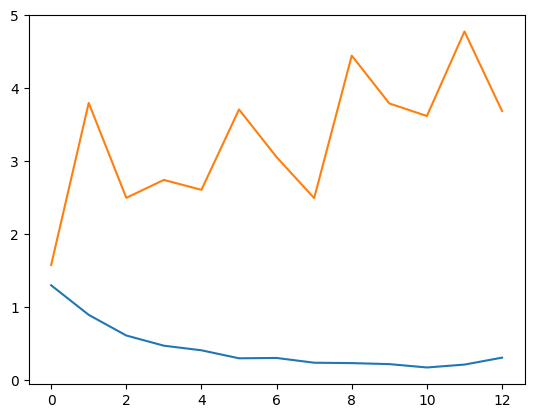

In [199]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])

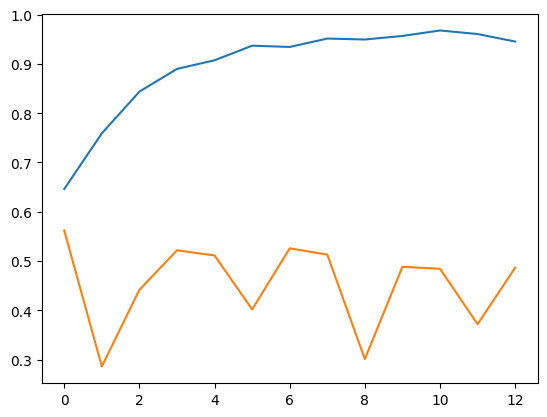

In [200]:
plt.plot(history.history['categorical_accuracy'])
plt.plot(history.history['val_categorical_accuracy'])

In [345]:
# best_model.save("best_model.keras")
loaded_best_model = tf.keras.models.load_model("best_model.keras")   #UWAGA

In [260]:
loaded_best_model.get_config()

{'name': 'sequential',
 'layers': [{'class_name': 'InputLayer',
   'config': {'batch_input_shape': (None, 1081),
    'dtype': 'float32',
    'sparse': False,
    'ragged': False,
    'name': 'embedding_input'}},
  {'class_name': 'Embedding',
   'config': {'name': 'embedding',
    'trainable': True,
    'batch_input_shape': (None, 1081),
    'dtype': 'float32',
    'input_dim': 108145,
    'output_dim': 64,
    'embeddings_initializer': {'class_name': 'RandomUniform',
     'config': {'minval': -0.05, 'maxval': 0.05, 'seed': None}},
    'embeddings_regularizer': None,
    'activity_regularizer': None,
    'embeddings_constraint': None,
    'mask_zero': False,
    'input_length': 1081}},
  {'class_name': 'GRU',
   'config': {'name': 'latent_layer',
    'trainable': True,
    'dtype': 'float32',
    'return_sequences': False,
    'return_state': False,
    'go_backwards': False,
    'stateful': False,
    'unroll': False,
    'time_major': False,
    'units': 128,
    'activation': 'tanh',

In [262]:
from keras.metrics import categorical_accuracy

preds_test = loaded_best_model.predict(X_emb_test, verbose=0)
c_test = categorical_accuracy(ku.to_categorical(Y_emb_test), preds_test).numpy()
print("Dokładność na zbiorze testowym wynosi: ", c_test.sum()/c_test.shape[0])
metric = F1Score(num_classes=16, average=None)
metric.update_state(ku.to_categorical(Y_emb_test), preds_test)
f_test = metric.result().numpy()
print("Wskaźnik F1 na zbiorze testowym dla poszczególnych klas: ", f_test) #kilka zer
metric2 = F1Score(num_classes=16, average='macro')
metric2.update_state(ku.to_categorical(Y_emb_test), preds_test)
f_test2 = metric2.result().numpy()
print("Wskaźnik F1 na zbiorze testowym uśredniony: ", f_test2)

preds_train = loaded_best_model.predict(X_emb, verbose=0)
c_train = categorical_accuracy(Y_emb, preds_train).numpy()
print("\nDokładność na zbiorze treningowym wynosi: ", c_train.sum()/c_train.shape[0])
metric = F1Score(num_classes=16, average=None)
metric.update_state(Y_emb, preds_train)
f_train = metric.result().numpy()
print("Wskaźnik F1 na zbiorze treningowym dla poszczególnych klas: ", f_train)
metric2 = F1Score(num_classes=16, average='macro')
metric2.update_state(Y_emb, preds_train)
f_train2 = metric2.result().numpy()
print("Wskaźnik F1 na zbiorze treningowym uśredniony: ", f_train2)

Dokładność na zbiorze testowym wynosi:  0.48645533141210373
Wskaźnik F1 na zbiorze testowym dla poszczególnych klas:  [0.4051282  0.14765102 0.6009105  0.52500004 0.22641508 0.25641027
 0.62899786 0.49612403 0.28070176 0.4516129  0.34920636 0.31034482
 0.         0.         0.1        0.        ]
Wskaźnik F1 na zbiorze testowym uśredniony:  0.2986564

Dokładność na zbiorze treningowym wynosi:  0.8877521613832853
Wskaźnik F1 na zbiorze treningowym dla poszczególnych klas:  [0.8854167  0.7166276  0.91906244 0.9280967  0.8580247  0.6945812
 0.97184986 0.89397794 0.75392663 0.8594249  0.91729325 0.9
 0.62068963 0.28571427 0.7142857  0.8135594 ]
Wskaźnik F1 na zbiorze treningowym uśredniony:  0.79578316


In [391]:
#sprawdzenie manualne dla inferencji pojedynczych rekordów
preds_list = []
for i in range(0, X_emb_test.shape[0]):
    p = loaded_best_model.predict(X_emb_test[i:i+1], verbose=0)
    preds_list.append(p[0])

In [394]:
c_test = categorical_accuracy(ku.to_categorical(Y_emb_test), preds_list).numpy()
print("Dokładność na zbiorze testowym wynosi: ", c_test.sum()/c_test.shape[0])
metric = F1Score(num_classes=16, average=None)
metric.update_state(ku.to_categorical(Y_emb_test), preds_list)
f_test = metric.result().numpy()
print("Wskaźnik F1 na zbiorze testowym dla poszczególnych klas: ", f_test)
metric2 = F1Score(num_classes=16, average='macro')
metric2.update_state(ku.to_categorical(Y_emb_test), preds_list)
f_test2 = metric2.result().numpy()
print("Wskaźnik F1 na zbiorze testowym uśredniony: ", f_test2)

Dokładność na zbiorze testowym wynosi:  0.48645533141210373
Wskaźnik F1 na zbiorze testowym dla poszczególnych klas:  [0.4051282  0.14765102 0.6009105  0.52500004 0.22641508 0.25641027
 0.62899786 0.49612403 0.28070176 0.4516129  0.34920636 0.31034482
 0.         0.         0.1        0.        ]
Wskaźnik F1 na zbiorze testowym uśredniony:  0.2986564


MultiHeadAttention

https://www.linkedin.com/pulse/anatomy-beast-many-heads-code-ibrahim-sobh-phd/

https://www.tensorflow.org/text/tutorials/nmt_with_attention

In [104]:
from keras_nlp.layers import TokenAndPositionEmbedding
emb = TokenAndPositionEmbedding(vocabulary_size = total_words + 1, sequence_length = max_tokens_len, embedding_dim = 64)
# emb = tf.keras.layers.Embedding(input_dim = total_words + 1, output_dim = 64, input_length = max_tokens_len)
embed = emb(X_emb[:10])
embed.shape   #liczba próbek/wielkość batcha, najdłuższa próbka, wymiary embeddingu 

Using TensorFlow backend


TensorShape([10, 1081, 64])

In [105]:
mha  = tf.keras.layers.MultiHeadAttention(4, 64, name='attention')
att = mha(embed, embed)
att.shape

TensorShape([10, 1081, 64])

In [106]:
#model z warstwą attention
#categorical_accuracy + F1

from keras.models import Sequential
from tensorflow.keras.optimizers import Adam
from keras import regularizers
# from keras_nlp.layers import TokenAndPositionEmbedding
from tensorflow_addons.metrics import F1Score

# model_w2v_attention = Sequential()
inputs = tf.keras.layers.Input(shape=(max_tokens_len, ), dtype=tf.int32, name='input')
emb = tf.keras.layers.Embedding(input_dim = total_words + 1, output_dim = 64, input_length = max_tokens_len)(inputs)
# emb = TokenAndPositionEmbedding(vocabulary_size = total_words + 1, sequence_length = max_tokens_len, embedding_dim = 64)(inputs)
att = tf.keras.layers.MultiHeadAttention(4, 64, name='attention')(query = emb, value = emb, return_attention_scores=False) #key_dim = Embedding output_dim
bn = tf.keras.layers.LayerNormalization()(att)
pool = tf.keras.layers.GlobalAveragePooling1D()(bn)  #zmniejszenie wymiarowości
linear = tf.keras.layers.Dense(32, activation="relu", kernel_regularizer=regularizers.l2(0.01))(pool)
drop = tf.keras.layers.Dropout(0.3)(linear)
soft = tf.keras.layers.Dense(16, activation='softmax')(drop)

model_emb_attention_f1 = tf.keras.Model(
	inputs=[inputs], 
	outputs=[soft]
)

model_emb_attention_f1.compile(loss="categorical_crossentropy", optimizer=Adam(learning_rate=0.0001), metrics=[tf.keras.metrics.CategoricalAccuracy(), F1Score(num_classes=16, average='macro')])
#mniejszy Adam learning rate = 0.0001, regularyzacja l2 w środkowej warstwie gęstej (i Dropout z poprzedniej wersji)

print(model_emb_attention_f1.summary())

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input (InputLayer)             [(None, 1081)]       0           []                               
                                                                                                  
 embedding_1 (Embedding)        (None, 1081, 64)     6921280     ['input[0][0]']                  
                                                                                                  
 attention (MultiHeadAttention)  (None, 1081, 64)    66368       ['embedding_1[0][0]',            
                                                                  'embedding_1[0][0]']            
                                                                                                  
 layer_normalization (LayerNorm  (None, 1081, 64)    128         ['attention[0][0]']          

In [107]:
import gc
gc.collect()

15046

In [108]:
model_emb_attention_f1(X_emb[:10]).shape

TensorShape([10, 16])

In [109]:
Y_emb.shape, Y_emb_test.shape, X_emb_test.shape

((6940, 16), (1735,), (1735, 1081))

In [110]:
#uwaga, tu są batche, więc acc i f1 są liczone na nich, a nie na całym zbiorze od razu
history = model_emb_attention_f1.fit(X_emb, Y_emb, epochs=20, verbose=1, batch_size=8, validation_data=(X_emb_test, ku.to_categorical(Y_emb_test)))

Epoch 1/20


868/868 [==============================] - 34s 39ms/step - loss: 2.7843 - categorical_accuracy: 0.1856 - f1_score: 0.0532 - val_loss: 2.5622 - val_categorical_accuracy: 0.2138 - val_f1_score: 0.0316
Epoch 2/20
868/868 [==============================] - 34s 39ms/step - loss: 2.4772 - categorical_accuracy: 0.2385 - f1_score: 0.0725 - val_loss: 2.2302 - val_categorical_accuracy: 0.3170 - val_f1_score: 0.0594
Epoch 3/20
868/868 [==============================] - 34s 39ms/step - loss: 2.1046 - categorical_accuracy: 0.3331 - f1_score: 0.1103 - val_loss: 2.0075 - val_categorical_accuracy: 0.3925 - val_f1_score: 0.1291
Epoch 4/20
868/868 [==============================] - 34s 39ms/step - loss: 1.8144 - categorical_accuracy: 0.4458 - f1_score: 0.1716 - val_loss: 1.8476 - val_categorical_accuracy: 0.4669 - val_f1_score: 0.1763
Epoch 5/20
868/868 [==============================] - 34s 39ms/step - loss: 1.5584 - categorical_accuracy: 0.5522 - f1_score: 0.2177 - val_loss: 1.7468 - val_categorical_a

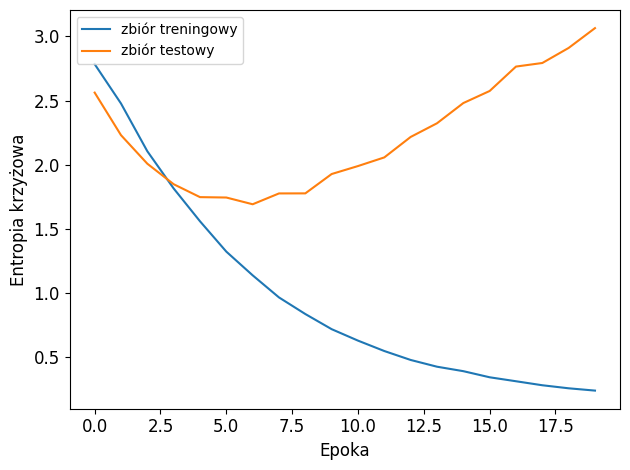

In [111]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.xlabel('Epoka', fontsize=12)
plt.ylabel('Entropia krzyżowa', fontsize=12)
plt.legend(['zbiór treningowy', 'zbiór testowy'])
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.tight_layout()
plt.savefig('model_emb_attention_f1_loss.png')

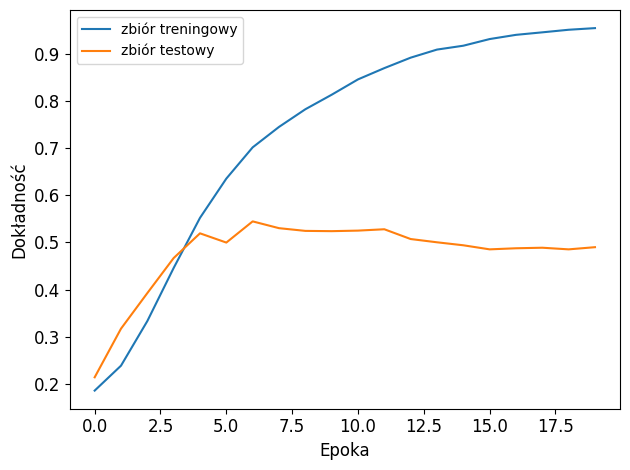

In [112]:
plt.plot(history.history['categorical_accuracy'])
plt.plot(history.history['val_categorical_accuracy'])
plt.xlabel('Epoka', fontsize=12)
plt.ylabel('Dokładność', fontsize=12)
plt.legend(['zbiór treningowy', 'zbiór testowy'])
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.tight_layout()
plt.savefig('model_emb_attention_f1_acc.png')

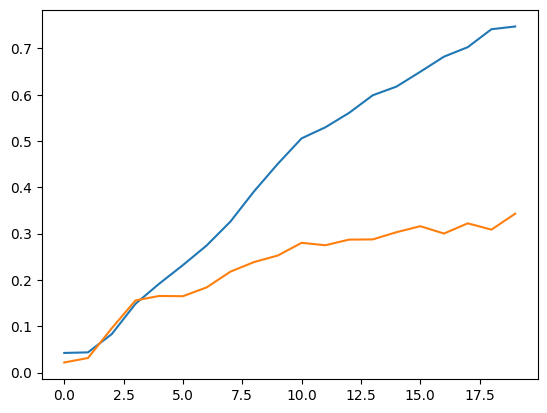

In [283]:
plt.plot(history.history['f1_score'])
plt.plot(history.history['val_f1_score'])

In [113]:
model_emb_attention_f1.save("model_emb_attention_f1.keras")
loaded_model_emb_attention_f1 = tf.keras.models.load_model("model_emb_attention_f1.keras")

In [285]:
from keras.metrics import categorical_accuracy

# preds_train = loaded_model_emb_attention.predict(X_emb)
# c_train = categorical_accuracy(Y_emb, preds_train).numpy()
# print("Dokładność na zbiorze treningowym wynosi: ", c_train.sum()/c_train.shape[0])

preds_test = loaded_model_emb_attention_f1.predict(X_emb_test)   #próba bez batchy
c_test = categorical_accuracy(ku.to_categorical(Y_emb_test), preds_test).numpy()
print("Dokładność na zbiorze testowym wynosi: ", c_test.sum()/c_test.shape[0])

# ResourceExhaustedError - problem z uzyskaniem wyników do porównania

ResourceExhaustedError: Graph execution error:

Detected at node 'model_6/attention/einsum/Einsum' defined at (most recent call last):
    File "c:\Users\marta\anaconda3\envs\mgr\lib\runpy.py", line 197, in _run_module_as_main
      return _run_code(code, main_globals, None,
    File "c:\Users\marta\anaconda3\envs\mgr\lib\runpy.py", line 87, in _run_code
      exec(code, run_globals)
    File "c:\Users\marta\anaconda3\envs\mgr\lib\site-packages\ipykernel_launcher.py", line 17, in <module>
      app.launch_new_instance()
    File "c:\Users\marta\anaconda3\envs\mgr\lib\site-packages\traitlets\config\application.py", line 1053, in launch_instance
      app.start()
    File "c:\Users\marta\anaconda3\envs\mgr\lib\site-packages\ipykernel\kernelapp.py", line 736, in start
      self.io_loop.start()
    File "c:\Users\marta\anaconda3\envs\mgr\lib\site-packages\tornado\platform\asyncio.py", line 215, in start
      self.asyncio_loop.run_forever()
    File "c:\Users\marta\anaconda3\envs\mgr\lib\asyncio\base_events.py", line 601, in run_forever
      self._run_once()
    File "c:\Users\marta\anaconda3\envs\mgr\lib\asyncio\base_events.py", line 1905, in _run_once
      handle._run()
    File "c:\Users\marta\anaconda3\envs\mgr\lib\asyncio\events.py", line 80, in _run
      self._context.run(self._callback, *self._args)
    File "c:\Users\marta\anaconda3\envs\mgr\lib\site-packages\ipykernel\kernelbase.py", line 516, in dispatch_queue
      await self.process_one()
    File "c:\Users\marta\anaconda3\envs\mgr\lib\site-packages\ipykernel\kernelbase.py", line 505, in process_one
      await dispatch(*args)
    File "c:\Users\marta\anaconda3\envs\mgr\lib\site-packages\ipykernel\kernelbase.py", line 412, in dispatch_shell
      await result
    File "c:\Users\marta\anaconda3\envs\mgr\lib\site-packages\ipykernel\kernelbase.py", line 740, in execute_request
      reply_content = await reply_content
    File "c:\Users\marta\anaconda3\envs\mgr\lib\site-packages\ipykernel\ipkernel.py", line 422, in do_execute
      res = shell.run_cell(
    File "c:\Users\marta\anaconda3\envs\mgr\lib\site-packages\ipykernel\zmqshell.py", line 546, in run_cell
      return super().run_cell(*args, **kwargs)
    File "c:\Users\marta\anaconda3\envs\mgr\lib\site-packages\IPython\core\interactiveshell.py", line 3024, in run_cell
      result = self._run_cell(
    File "c:\Users\marta\anaconda3\envs\mgr\lib\site-packages\IPython\core\interactiveshell.py", line 3079, in _run_cell
      result = runner(coro)
    File "c:\Users\marta\anaconda3\envs\mgr\lib\site-packages\IPython\core\async_helpers.py", line 129, in _pseudo_sync_runner
      coro.send(None)
    File "c:\Users\marta\anaconda3\envs\mgr\lib\site-packages\IPython\core\interactiveshell.py", line 3284, in run_cell_async
      has_raised = await self.run_ast_nodes(code_ast.body, cell_name,
    File "c:\Users\marta\anaconda3\envs\mgr\lib\site-packages\IPython\core\interactiveshell.py", line 3466, in run_ast_nodes
      if await self.run_code(code, result, async_=asy):
    File "c:\Users\marta\anaconda3\envs\mgr\lib\site-packages\IPython\core\interactiveshell.py", line 3526, in run_code
      exec(code_obj, self.user_global_ns, self.user_ns)
    File "C:\Users\marta\AppData\Local\Temp\ipykernel_22092\2260433023.py", line 7, in <module>
      preds_test = loaded_model_emb_attention_f1.predict(X_emb_test)
    File "c:\Users\marta\anaconda3\envs\mgr\lib\site-packages\keras\utils\traceback_utils.py", line 65, in error_handler
      return fn(*args, **kwargs)
    File "c:\Users\marta\anaconda3\envs\mgr\lib\site-packages\keras\engine\training.py", line 2253, in predict
      tmp_batch_outputs = self.predict_function(iterator)
    File "c:\Users\marta\anaconda3\envs\mgr\lib\site-packages\keras\engine\training.py", line 2041, in predict_function
      return step_function(self, iterator)
    File "c:\Users\marta\anaconda3\envs\mgr\lib\site-packages\keras\engine\training.py", line 2027, in step_function
      outputs = model.distribute_strategy.run(run_step, args=(data,))
    File "c:\Users\marta\anaconda3\envs\mgr\lib\site-packages\keras\engine\training.py", line 2015, in run_step
      outputs = model.predict_step(data)
    File "c:\Users\marta\anaconda3\envs\mgr\lib\site-packages\keras\engine\training.py", line 1983, in predict_step
      return self(x, training=False)
    File "c:\Users\marta\anaconda3\envs\mgr\lib\site-packages\keras\utils\traceback_utils.py", line 65, in error_handler
      return fn(*args, **kwargs)
    File "c:\Users\marta\anaconda3\envs\mgr\lib\site-packages\keras\engine\training.py", line 557, in __call__
      return super().__call__(*args, **kwargs)
    File "c:\Users\marta\anaconda3\envs\mgr\lib\site-packages\keras\utils\traceback_utils.py", line 65, in error_handler
      return fn(*args, **kwargs)
    File "c:\Users\marta\anaconda3\envs\mgr\lib\site-packages\keras\engine\base_layer.py", line 1097, in __call__
      outputs = call_fn(inputs, *args, **kwargs)
    File "c:\Users\marta\anaconda3\envs\mgr\lib\site-packages\keras\utils\traceback_utils.py", line 96, in error_handler
      return fn(*args, **kwargs)
    File "c:\Users\marta\anaconda3\envs\mgr\lib\site-packages\keras\engine\functional.py", line 510, in call
      return self._run_internal_graph(inputs, training=training, mask=mask)
    File "c:\Users\marta\anaconda3\envs\mgr\lib\site-packages\keras\engine\functional.py", line 667, in _run_internal_graph
      outputs = node.layer(*args, **kwargs)
    File "c:\Users\marta\anaconda3\envs\mgr\lib\site-packages\keras\utils\traceback_utils.py", line 65, in error_handler
      return fn(*args, **kwargs)
    File "c:\Users\marta\anaconda3\envs\mgr\lib\site-packages\keras\engine\base_layer.py", line 1097, in __call__
      outputs = call_fn(inputs, *args, **kwargs)
    File "c:\Users\marta\anaconda3\envs\mgr\lib\site-packages\keras\utils\traceback_utils.py", line 96, in error_handler
      return fn(*args, **kwargs)
    File "c:\Users\marta\anaconda3\envs\mgr\lib\site-packages\keras\layers\attention\multi_head_attention.py", line 596, in call
      attention_output, attention_scores = self._compute_attention(
    File "c:\Users\marta\anaconda3\envs\mgr\lib\site-packages\keras\layers\attention\multi_head_attention.py", line 525, in _compute_attention
      attention_scores = tf.einsum(self._dot_product_equation, key, query)
Node: 'model_6/attention/einsum/Einsum'
OOM when allocating tensor with shape[32,4,1081,1081] and type float on /job:localhost/replica:0/task:0/device:GPU:0 by allocator GPU_0_bfc
	 [[{{node model_6/attention/einsum/Einsum}}]]
Hint: If you want to see a list of allocated tensors when OOM happens, add report_tensor_allocations_upon_oom to RunOptions for current allocation info. This isn't available when running in Eager mode.
 [Op:__inference_predict_function_159001]

In [114]:
#inferencja pojedynczych rekordów (zbiór testowy)
preds_list = []
for i in range(0, X_emb_test.shape[0]):
    p = loaded_model_emb_attention_f1.predict(X_emb_test[i:i+1], verbose=0)
    preds_list.append(p[0])

In [115]:
c_test = categorical_accuracy(ku.to_categorical(Y_emb_test), preds_list).numpy()
print("Dokładność na zbiorze testowym wynosi: ", c_test.sum()/c_test.shape[0])
metric = F1Score(num_classes=16, average=None)
metric.update_state(ku.to_categorical(Y_emb_test), preds_list)
f_test = metric.result().numpy()
print("Wskaźnik F1 na zbiorze testowym dla poszczególnych klas: ", f_test)
metric2 = F1Score(num_classes=16, average='macro')
metric2.update_state(ku.to_categorical(Y_emb_test), preds_list)
f_test2 = metric2.result().numpy()
print("Wskaźnik F1 na zbiorze testowym uśredniony: ", f_test2)

Dokładność na zbiorze testowym wynosi:  0.4899135446685879
Wskaźnik F1 na zbiorze testowym dla poszczególnych klas:  [0.55712056 0.43835613 0.54794526 0.53069305 0.175      0.03333333
 0.6823529  0.43137255 0.18348624 0.36206898 0.07751938 0.17475727
 0.08000001 0.         0.         0.        ]
Wskaźnik F1 na zbiorze testowym uśredniony:  0.26712537


In [116]:
#inferencja pojedynczych rekordów (zbiór treningowy)
preds_list_train = []
for i in range(0, X_emb.shape[0]):
    p = loaded_model_emb_attention_f1.predict(X_emb[i:i+1], verbose=0)
    preds_list_train.append(p[0])

In [117]:
c_train = categorical_accuracy(Y_emb, preds_list_train).numpy()
print("\nDokładność na zbiorze treningowym wynosi: ", c_train.sum()/c_train.shape[0])
metric = F1Score(num_classes=16, average=None)
metric.update_state(Y_emb, preds_list_train)
f_train = metric.result().numpy()
print("Wskaźnik F1 na zbiorze treningowym dla poszczególnych klas: ", f_train)
metric2 = F1Score(num_classes=16, average='macro')
metric2.update_state(Y_emb, preds_list_train)
f_train2 = metric2.result().numpy()
print("Wskaźnik F1 na zbiorze treningowym uśredniony: ", f_train2)


Dokładność na zbiorze treningowym wynosi:  0.975792507204611
Wskaźnik F1 na zbiorze treningowym dla poszczególnych klas:  [0.9957663  1.         0.99904037 0.99828076 0.99456525 0.9587302
 0.99761665 0.9880843  0.875      0.9872029  0.8776978  0.89944136
 0.52525246 0.         0.         0.11428572]
Wskaźnik F1 na zbiorze treningowym uśredniony:  0.76318526


In [273]:
#model z warstwą attention
#tylko categorical_accuracy

from keras.models import Sequential
from tensorflow.keras.optimizers import Adam
from keras import regularizers
# from keras_nlp.layers import TokenAndPositionEmbedding
from tensorflow_addons.metrics import F1Score

# model_w2v_attention = Sequential()
inputs = tf.keras.layers.Input(shape=(max_tokens_len, ), dtype=tf.int32, name='input')
emb = tf.keras.layers.Embedding(input_dim = total_words + 1, output_dim = 64, input_length = max_tokens_len)(inputs)
# emb = TokenAndPositionEmbedding(vocabulary_size = total_words + 1, sequence_length = max_tokens_len, embedding_dim = 64)(inputs)
att = tf.keras.layers.MultiHeadAttention(4, 64, name='attention')(query = emb, value = emb, return_attention_scores=False) #key_dim = Embedding output_dim
bn = tf.keras.layers.LayerNormalization()(att)
pool = tf.keras.layers.GlobalAveragePooling1D()(bn)  #zmniejszenie wymiarowości
linear = tf.keras.layers.Dense(32, activation="relu", kernel_regularizer=regularizers.l2(0.01))(pool)
drop = tf.keras.layers.Dropout(0.3)(linear)
soft = tf.keras.layers.Dense(16, activation='softmax')(drop)

model_emb_attention = tf.keras.Model(
	inputs=[inputs], 
	outputs=[soft]
)

model_emb_attention.compile(loss="categorical_crossentropy", optimizer=Adam(learning_rate=0.0001), metrics=[tf.keras.metrics.CategoricalAccuracy(), F1Score(num_classes=16, average='macro')])
#mniejszy Adam learning rate = 0.0001, regularyzacja l2 w środkowej warstwie gęstej (i Dropout z poprzedniej wersji)

print(model_emb_attention.summary())

Model: "model_5"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input (InputLayer)             [(None, 1081)]       0           []                               
                                                                                                  
 embedding_6 (Embedding)        (None, 1081, 64)     6921280     ['input[0][0]']                  
                                                                                                  
 attention (MultiHeadAttention)  (None, 1081, 64)    66368       ['embedding_6[0][0]',            
                                                                  'embedding_6[0][0]']            
                                                                                                  
 layer_normalization_5 (LayerNo  (None, 1081, 64)    128         ['attention[0][0]']        

In [153]:
history = model_emb_attention.fit(X_emb, Y_emb, epochs=20, verbose=1, batch_size=8, validation_data=(X_emb_test, ku.to_categorical(Y_emb_test)))

Epoch 1/20
868/868 [==============================] - 34s 39ms/step - loss: 2.7611 - categorical_accuracy: 0.1850 - val_loss: 2.5566 - val_categorical_accuracy: 0.2115
Epoch 2/20
868/868 [==============================] - 34s 39ms/step - loss: 2.4998 - categorical_accuracy: 0.2419 - val_loss: 2.2826 - val_categorical_accuracy: 0.3141
Epoch 3/20
868/868 [==============================] - 34s 39ms/step - loss: 2.2092 - categorical_accuracy: 0.2976 - val_loss: 2.0970 - val_categorical_accuracy: 0.3597
Epoch 4/20
868/868 [==============================] - 34s 40ms/step - loss: 1.9955 - categorical_accuracy: 0.3506 - val_loss: 1.9676 - val_categorical_accuracy: 0.4000
Epoch 5/20
868/868 [==============================] - 35s 40ms/step - loss: 1.7509 - categorical_accuracy: 0.4527 - val_loss: 1.8354 - val_categorical_accuracy: 0.4398
Epoch 6/20
868/868 [==============================] - 36s 41ms/step - loss: 1.5082 - categorical_accuracy: 0.5504 - val_loss: 1.7299 - val_categorical_accuracy:

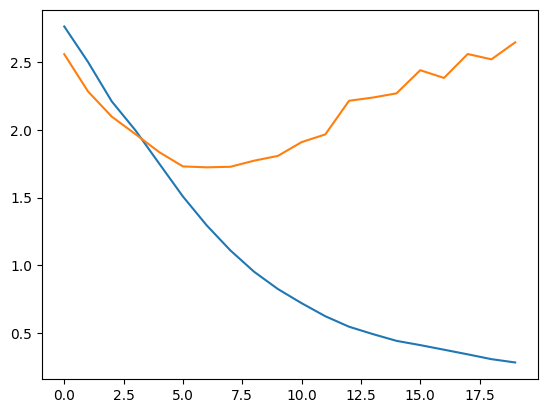

In [158]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])

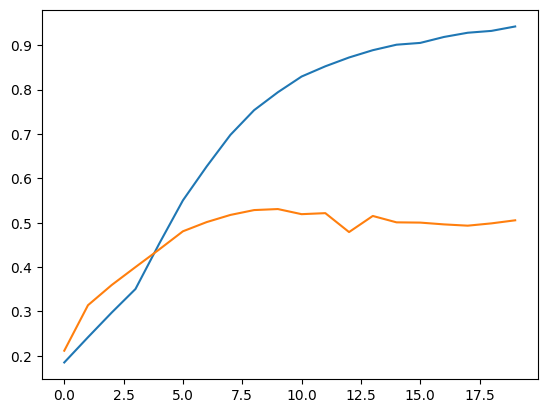

In [159]:
plt.plot(history.history['categorical_accuracy'])
plt.plot(history.history['val_categorical_accuracy'])

In [263]:
# model_emb_attention.save("model_emb_attention.keras")
loaded_model_emb_attention = tf.keras.models.load_model("model_emb_attention.keras")

In [264]:
import gc
gc.collect()

7415

In [265]:
from keras.metrics import categorical_accuracy

# preds_train = loaded_model_w2v_attention.predict(X_w2v)
# c_train = categorical_accuracy(Y_w2v, preds_train).numpy()
# print("Dokładność na zbiorze treningowym wynosi: ", c_train.sum()/c_train.shape[0])

preds_test = loaded_model_emb_attention.predict(X_emb_test)
c_test = categorical_accuracy(ku.to_categorical(Y_emb_test), preds_test).numpy()
print("Dokładność na zbiorze testowym wynosi: ", c_test.sum()/c_test.shape[0])

# ResourceExhaustedError - problem z uzyskaniem wyników do porównania

ResourceExhaustedError: Graph execution error:

Detected at node 'model_15/attention/einsum/Einsum' defined at (most recent call last):
    File "c:\Users\marta\anaconda3\envs\mgr\lib\runpy.py", line 197, in _run_module_as_main
      return _run_code(code, main_globals, None,
    File "c:\Users\marta\anaconda3\envs\mgr\lib\runpy.py", line 87, in _run_code
      exec(code, run_globals)
    File "c:\Users\marta\anaconda3\envs\mgr\lib\site-packages\ipykernel_launcher.py", line 17, in <module>
      app.launch_new_instance()
    File "c:\Users\marta\anaconda3\envs\mgr\lib\site-packages\traitlets\config\application.py", line 1053, in launch_instance
      app.start()
    File "c:\Users\marta\anaconda3\envs\mgr\lib\site-packages\ipykernel\kernelapp.py", line 736, in start
      self.io_loop.start()
    File "c:\Users\marta\anaconda3\envs\mgr\lib\site-packages\tornado\platform\asyncio.py", line 215, in start
      self.asyncio_loop.run_forever()
    File "c:\Users\marta\anaconda3\envs\mgr\lib\asyncio\base_events.py", line 601, in run_forever
      self._run_once()
    File "c:\Users\marta\anaconda3\envs\mgr\lib\asyncio\base_events.py", line 1905, in _run_once
      handle._run()
    File "c:\Users\marta\anaconda3\envs\mgr\lib\asyncio\events.py", line 80, in _run
      self._context.run(self._callback, *self._args)
    File "c:\Users\marta\anaconda3\envs\mgr\lib\site-packages\ipykernel\kernelbase.py", line 516, in dispatch_queue
      await self.process_one()
    File "c:\Users\marta\anaconda3\envs\mgr\lib\site-packages\ipykernel\kernelbase.py", line 505, in process_one
      await dispatch(*args)
    File "c:\Users\marta\anaconda3\envs\mgr\lib\site-packages\ipykernel\kernelbase.py", line 412, in dispatch_shell
      await result
    File "c:\Users\marta\anaconda3\envs\mgr\lib\site-packages\ipykernel\kernelbase.py", line 740, in execute_request
      reply_content = await reply_content
    File "c:\Users\marta\anaconda3\envs\mgr\lib\site-packages\ipykernel\ipkernel.py", line 422, in do_execute
      res = shell.run_cell(
    File "c:\Users\marta\anaconda3\envs\mgr\lib\site-packages\ipykernel\zmqshell.py", line 546, in run_cell
      return super().run_cell(*args, **kwargs)
    File "c:\Users\marta\anaconda3\envs\mgr\lib\site-packages\IPython\core\interactiveshell.py", line 3024, in run_cell
      result = self._run_cell(
    File "c:\Users\marta\anaconda3\envs\mgr\lib\site-packages\IPython\core\interactiveshell.py", line 3079, in _run_cell
      result = runner(coro)
    File "c:\Users\marta\anaconda3\envs\mgr\lib\site-packages\IPython\core\async_helpers.py", line 129, in _pseudo_sync_runner
      coro.send(None)
    File "c:\Users\marta\anaconda3\envs\mgr\lib\site-packages\IPython\core\interactiveshell.py", line 3284, in run_cell_async
      has_raised = await self.run_ast_nodes(code_ast.body, cell_name,
    File "c:\Users\marta\anaconda3\envs\mgr\lib\site-packages\IPython\core\interactiveshell.py", line 3466, in run_ast_nodes
      if await self.run_code(code, result, async_=asy):
    File "c:\Users\marta\anaconda3\envs\mgr\lib\site-packages\IPython\core\interactiveshell.py", line 3526, in run_code
      exec(code_obj, self.user_global_ns, self.user_ns)
    File "C:\Users\marta\AppData\Local\Temp\ipykernel_22092\3374970476.py", line 7, in <module>
      preds_test = loaded_model_emb_attention.predict(X_emb_test)
    File "c:\Users\marta\anaconda3\envs\mgr\lib\site-packages\keras\utils\traceback_utils.py", line 65, in error_handler
      return fn(*args, **kwargs)
    File "c:\Users\marta\anaconda3\envs\mgr\lib\site-packages\keras\engine\training.py", line 2253, in predict
      tmp_batch_outputs = self.predict_function(iterator)
    File "c:\Users\marta\anaconda3\envs\mgr\lib\site-packages\keras\engine\training.py", line 2041, in predict_function
      return step_function(self, iterator)
    File "c:\Users\marta\anaconda3\envs\mgr\lib\site-packages\keras\engine\training.py", line 2027, in step_function
      outputs = model.distribute_strategy.run(run_step, args=(data,))
    File "c:\Users\marta\anaconda3\envs\mgr\lib\site-packages\keras\engine\training.py", line 2015, in run_step
      outputs = model.predict_step(data)
    File "c:\Users\marta\anaconda3\envs\mgr\lib\site-packages\keras\engine\training.py", line 1983, in predict_step
      return self(x, training=False)
    File "c:\Users\marta\anaconda3\envs\mgr\lib\site-packages\keras\utils\traceback_utils.py", line 65, in error_handler
      return fn(*args, **kwargs)
    File "c:\Users\marta\anaconda3\envs\mgr\lib\site-packages\keras\engine\training.py", line 557, in __call__
      return super().__call__(*args, **kwargs)
    File "c:\Users\marta\anaconda3\envs\mgr\lib\site-packages\keras\utils\traceback_utils.py", line 65, in error_handler
      return fn(*args, **kwargs)
    File "c:\Users\marta\anaconda3\envs\mgr\lib\site-packages\keras\engine\base_layer.py", line 1097, in __call__
      outputs = call_fn(inputs, *args, **kwargs)
    File "c:\Users\marta\anaconda3\envs\mgr\lib\site-packages\keras\utils\traceback_utils.py", line 96, in error_handler
      return fn(*args, **kwargs)
    File "c:\Users\marta\anaconda3\envs\mgr\lib\site-packages\keras\engine\functional.py", line 510, in call
      return self._run_internal_graph(inputs, training=training, mask=mask)
    File "c:\Users\marta\anaconda3\envs\mgr\lib\site-packages\keras\engine\functional.py", line 667, in _run_internal_graph
      outputs = node.layer(*args, **kwargs)
    File "c:\Users\marta\anaconda3\envs\mgr\lib\site-packages\keras\utils\traceback_utils.py", line 65, in error_handler
      return fn(*args, **kwargs)
    File "c:\Users\marta\anaconda3\envs\mgr\lib\site-packages\keras\engine\base_layer.py", line 1097, in __call__
      outputs = call_fn(inputs, *args, **kwargs)
    File "c:\Users\marta\anaconda3\envs\mgr\lib\site-packages\keras\utils\traceback_utils.py", line 96, in error_handler
      return fn(*args, **kwargs)
    File "c:\Users\marta\anaconda3\envs\mgr\lib\site-packages\keras\layers\attention\multi_head_attention.py", line 596, in call
      attention_output, attention_scores = self._compute_attention(
    File "c:\Users\marta\anaconda3\envs\mgr\lib\site-packages\keras\layers\attention\multi_head_attention.py", line 525, in _compute_attention
      attention_scores = tf.einsum(self._dot_product_equation, key, query)
Node: 'model_15/attention/einsum/Einsum'
OOM when allocating tensor with shape[32,4,1081,1081] and type float on /job:localhost/replica:0/task:0/device:GPU:0 by allocator GPU_0_bfc
	 [[{{node model_15/attention/einsum/Einsum}}]]
Hint: If you want to see a list of allocated tensors when OOM happens, add report_tensor_allocations_upon_oom to RunOptions for current allocation info. This isn't available when running in Eager mode.
 [Op:__inference_predict_function_29985]